In [3]:
# ============================================================
# SECTION 1 — Imports and reproducibility
# ============================================================

import os
import json
import random
from pathlib import Path

import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt

SEED = 42

os.environ["PYTHONHASHSEED"] = str(SEED)
random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

print("TensorFlow:", tf.__version__)
print("NumPy:", np.__version__)
print("Seed:", SEED)

TensorFlow: 2.21.0
NumPy: 1.26.4
Seed: 42


In [4]:
# ============================================================
# SECTION 2 — Project paths
# ============================================================

PROJECT_ROOT = Path(
    "/Volumes/Expansion/PLOS_2D_UNet_Revision"
)

PROCESSED_DIR = PROJECT_ROOT / "processed"
METADATA_DIR = PROJECT_ROOT / "metadata"
RESULTS_DIR = PROJECT_ROOT / "results"
FIGURES_DIR = PROJECT_ROOT / "figures"
MODELS_DIR = PROJECT_ROOT / "models"

for folder in [
    RESULTS_DIR,
    FIGURES_DIR,
    MODELS_DIR,
]:
    folder.mkdir(parents=True, exist_ok=True)

SLICE_INDEX_PATH = (
    METADATA_DIR /
    "slice_level_index_seed42.csv"
)

print("Processed data:", PROCESSED_DIR)
print("Slice index:", SLICE_INDEX_PATH)

Processed data: /Volumes/Expansion/PLOS_2D_UNet_Revision/processed
Slice index: /Volumes/Expansion/PLOS_2D_UNet_Revision/metadata/slice_level_index_seed42.csv


In [5]:
# ============================================================
# SECTION 3 — Load slice index
# ============================================================

slice_index_df = pd.read_csv(SLICE_INDEX_PATH)

train_df = (
    slice_index_df[
        slice_index_df["split"] == "train"
    ]
    .reset_index(drop=True)
)

val_df = (
    slice_index_df[
        slice_index_df["split"] == "validation"
    ]
    .reset_index(drop=True)
)

test_df = (
    slice_index_df[
        slice_index_df["split"] == "test"
    ]
    .reset_index(drop=True)
)

print("Train slices:", len(train_df))
print("Validation slices:", len(val_df))
print("Test slices:", len(test_df))

print("\nPositive slices:")
print("Train:", int(train_df["is_positive"].sum()))
print("Validation:", int(val_df["is_positive"].sum()))
print("Test:", int(test_df["is_positive"].sum()))

Train slices: 85439
Validation slices: 17484
Test slices: 16893

Positive slices:
Train: 5379
Validation: 1195
Test: 1142


In [6]:
# ============================================================
# SECTION 4 — Single-slice loader
# ============================================================

def load_npz_slice(
    npz_path: str,
    slice_index: int,
):
    with np.load(npz_path) as data:
        image = data["volume_normalized"][
            :, :, int(slice_index)
        ]

        mask = data["consensus_mask"][
            :, :, int(slice_index)
        ]

    image = image.astype(np.float32)[..., None]
    mask = mask.astype(np.float32)[..., None]

    return image, mask

In [7]:
positive_row = (
    train_df[
        train_df["is_positive"] == True
    ]
    .iloc[0]
)

image, mask = load_npz_slice(
    positive_row["npz_path"],
    positive_row["slice_index"],
)

print("Image shape:", image.shape)
print("Mask shape:", mask.shape)
print("Image range:", image.min(), image.max())
print("Mask values:", np.unique(mask))

Image shape: (256, 256, 1)
Mask shape: (256, 256, 1)
Image range: 0.0 1.0
Mask values: [0. 1.]


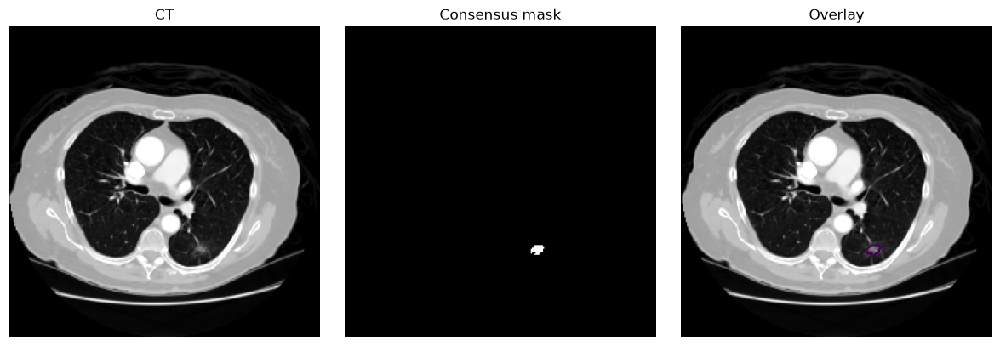

In [8]:
fig, axes = plt.subplots(
    1,
    3,
    figsize=(12, 4)
)

axes[0].imshow(
    image[:, :, 0],
    cmap="gray",
)
axes[0].set_title("CT")

axes[1].imshow(
    mask[:, :, 0],
    cmap="gray",
)
axes[1].set_title("Consensus mask")

axes[2].imshow(
    image[:, :, 0],
    cmap="gray",
)
axes[2].contour(
    mask[:, :, 0],
    levels=[0.5],
    linewidths=1.5,
)
axes[2].set_title("Overlay")

for ax in axes:
    ax.axis("off")

plt.tight_layout()
plt.show()

In [9]:
# ============================================================
# SECTION 5 — Experiment configuration
# ============================================================

IMAGE_HEIGHT = 256
IMAGE_WIDTH = 256
CHANNELS = 1

BATCH_SIZE = 8
SEED = 42

TRAIN_POSITIVE_FRACTION = 0.50

# Number of balanced training batches generated per epoch.
# 400 batches × 8 slices = 3,200 training slices per epoch.
TRAIN_STEPS_PER_EPOCH = 400

print("Image size:", (IMAGE_HEIGHT, IMAGE_WIDTH, CHANNELS))
print("Batch size:", BATCH_SIZE)
print("Training positive fraction:", TRAIN_POSITIVE_FRACTION)
print("Training slices per epoch:",
      TRAIN_STEPS_PER_EPOCH * BATCH_SIZE)

Image size: (256, 256, 1)
Batch size: 8
Training positive fraction: 0.5
Training slices per epoch: 3200


In [10]:
# ============================================================
# SECTION 6 — Training slice pools
# ============================================================

train_positive_df = (
    train_df[
        train_df["is_positive"] == True
    ]
    .reset_index(drop=True)
)

train_negative_df = (
    train_df[
        train_df["is_positive"] == False
    ]
    .reset_index(drop=True)
)

print("Positive training slices:", len(train_positive_df))
print("Negative training slices:", len(train_negative_df))

assert len(train_positive_df) > 0
assert len(train_negative_df) > 0

Positive training slices: 5379
Negative training slices: 80060


In [11]:
# ============================================================
# SECTION 7 — Balanced training generator
# ============================================================

class BalancedSegmentationSequence(tf.keras.utils.Sequence):

    def __init__(
        self,
        positive_df,
        negative_df,
        batch_size=8,
        positive_fraction=0.50,
        steps_per_epoch=400,
        seed=42,
        shuffle=True,
        **kwargs,
    ):
        super().__init__(**kwargs)

        self.positive_df = positive_df.reset_index(drop=True)
        self.negative_df = negative_df.reset_index(drop=True)

        self.batch_size = int(batch_size)
        self.positive_fraction = float(positive_fraction)
        self.steps_per_epoch = int(steps_per_epoch)
        self.shuffle = bool(shuffle)

        self.rng = np.random.default_rng(seed)

        self.n_positive = int(
            round(self.batch_size * self.positive_fraction)
        )

        self.n_negative = (
            self.batch_size - self.n_positive
        )

        if self.n_positive < 1:
            raise ValueError(
                "Each batch must contain at least one positive slice."
            )

        if self.n_negative < 1:
            raise ValueError(
                "Each batch must contain at least one negative slice."
            )

        print(
            f"Balanced generator: "
            f"{self.n_positive} positive + "
            f"{self.n_negative} negative per batch"
        )

    def __len__(self):
        return self.steps_per_epoch

    def _load_row(self, row):
        npz_path = row["npz_path"]
        slice_index = int(row["slice_index"])

        with np.load(npz_path) as data:
            image = data["volume_normalized"][
                :, :, slice_index
            ]

            mask = data["consensus_mask"][
                :, :, slice_index
            ]

        image = image.astype(np.float32)[..., None]
        mask = mask.astype(np.float32)[..., None]

        return image, mask

    def __getitem__(self, index):

        positive_indices = self.rng.integers(
            low=0,
            high=len(self.positive_df),
            size=self.n_positive,
        )

        negative_indices = self.rng.integers(
            low=0,
            high=len(self.negative_df),
            size=self.n_negative,
        )

        selected_rows = []

        for idx in positive_indices:
            selected_rows.append(
                self.positive_df.iloc[int(idx)]
            )

        for idx in negative_indices:
            selected_rows.append(
                self.negative_df.iloc[int(idx)]
            )

        if self.shuffle:
            self.rng.shuffle(selected_rows)

        images = []
        masks = []

        for row in selected_rows:
            image, mask = self._load_row(row)

            images.append(image)
            masks.append(mask)

        X = np.stack(images).astype(np.float32)
        Y = np.stack(masks).astype(np.float32)

        return X, Y

In [12]:
train_sequence = BalancedSegmentationSequence(
    positive_df=train_positive_df,
    negative_df=train_negative_df,
    batch_size=BATCH_SIZE,
    positive_fraction=TRAIN_POSITIVE_FRACTION,
    steps_per_epoch=TRAIN_STEPS_PER_EPOCH,
    seed=SEED,
    shuffle=True,
)

Balanced generator: 4 positive + 4 negative per batch


In [13]:
# ============================================================
# SECTION 8 — Deterministic evaluation generator
# ============================================================

class EvaluationSegmentationSequence(tf.keras.utils.Sequence):

    def __init__(
        self,
        dataframe,
        batch_size=8,
        **kwargs,
    ):
        super().__init__(**kwargs)

        self.dataframe = dataframe.reset_index(drop=True)
        self.batch_size = int(batch_size)

    def __len__(self):
        return int(
            np.ceil(
                len(self.dataframe) / self.batch_size
            )
        )

    def _load_row(self, row):
        npz_path = row["npz_path"]
        slice_index = int(row["slice_index"])

        with np.load(npz_path) as data:
            image = data["volume_normalized"][
                :, :, slice_index
            ]

            mask = data["consensus_mask"][
                :, :, slice_index
            ]

        image = image.astype(np.float32)[..., None]
        mask = mask.astype(np.float32)[..., None]

        return image, mask

    def __getitem__(self, index):

        start = index * self.batch_size
        end = min(
            start + self.batch_size,
            len(self.dataframe),
        )

        batch_df = self.dataframe.iloc[start:end]

        images = []
        masks = []

        for _, row in batch_df.iterrows():
            image, mask = self._load_row(row)

            images.append(image)
            masks.append(mask)

        X = np.stack(images).astype(np.float32)
        Y = np.stack(masks).astype(np.float32)

        return X, Y

In [14]:
val_sequence = EvaluationSegmentationSequence(
    dataframe=val_df,
    batch_size=BATCH_SIZE,
)

test_sequence = EvaluationSegmentationSequence(
    dataframe=test_df,
    batch_size=BATCH_SIZE,
)

print("Validation batches:", len(val_sequence))
print("Test batches:", len(test_sequence))

Validation batches: 2186
Test batches: 2112


In [15]:
# ============================================================
# SECTION 9 — Batch validation
# ============================================================

X_batch, Y_batch = train_sequence[0]

print("X shape:", X_batch.shape)
print("Y shape:", Y_batch.shape)

print("X dtype:", X_batch.dtype)
print("Y dtype:", Y_batch.dtype)

print("Image minimum:", X_batch.min())
print("Image maximum:", X_batch.max())

print("Mask values:", np.unique(Y_batch))

positive_in_batch = np.sum(
    Y_batch.reshape(
        Y_batch.shape[0], -1
    ).sum(axis=1) > 0
)

negative_in_batch = (
    Y_batch.shape[0] - positive_in_batch
)

print("Positive slices in batch:", positive_in_batch)
print("Negative slices in batch:", negative_in_batch)

assert X_batch.shape == (
    BATCH_SIZE,
    IMAGE_HEIGHT,
    IMAGE_WIDTH,
    CHANNELS,
)

assert Y_batch.shape == (
    BATCH_SIZE,
    IMAGE_HEIGHT,
    IMAGE_WIDTH,
    CHANNELS,
)

assert positive_in_batch == 4
assert negative_in_batch == 4

assert set(np.unique(Y_batch)).issubset(
    {0.0, 1.0}
)

print("Balanced training batch test: PASSED")

X shape: (8, 256, 256, 1)
Y shape: (8, 256, 256, 1)
X dtype: float32
Y dtype: float32
Image minimum: 0.0
Image maximum: 1.0
Mask values: [0. 1.]
Positive slices in batch: 4
Negative slices in batch: 4
Balanced training batch test: PASSED


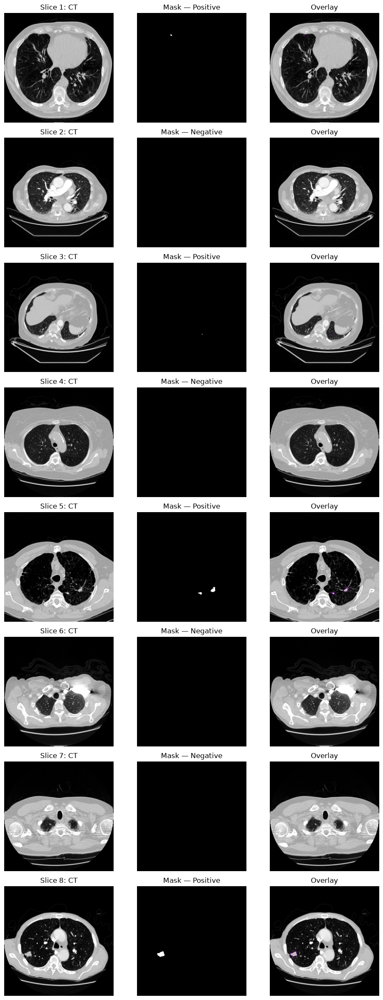

In [16]:
# ============================================================
# SECTION 10 — Visualize one training batch
# ============================================================

fig, axes = plt.subplots(
    BATCH_SIZE,
    3,
    figsize=(10, 3 * BATCH_SIZE),
)

for i in range(BATCH_SIZE):

    image = X_batch[i, :, :, 0]
    mask = Y_batch[i, :, :, 0]

    axes[i, 0].imshow(
        image,
        cmap="gray",
        vmin=0,
        vmax=1,
    )
    axes[i, 0].set_title(
        f"Slice {i + 1}: CT"
    )

    axes[i, 1].imshow(
        mask,
        cmap="gray",
        vmin=0,
        vmax=1,
    )

    slice_type = (
        "Positive"
        if mask.sum() > 0
        else "Negative"
    )

    axes[i, 1].set_title(
        f"Mask — {slice_type}"
    )

    axes[i, 2].imshow(
        image,
        cmap="gray",
        vmin=0,
        vmax=1,
    )

    if mask.sum() > 0:
        axes[i, 2].contour(
            mask,
            levels=[0.5],
            linewidths=1.2,
        )

    axes[i, 2].set_title("Overlay")

    for j in range(3):
        axes[i, j].axis("off")

plt.tight_layout()
plt.show()

In [17]:
# ============================================================
# SECTION 11 — Validation and test checks
# ============================================================

X_val, Y_val = val_sequence[0]
X_test, Y_test = test_sequence[0]

print("Validation batch:")
print("X:", X_val.shape)
print("Y:", Y_val.shape)

print("\nTest batch:")
print("X:", X_test.shape)
print("Y:", Y_test.shape)

assert X_val.shape[1:] == (
    IMAGE_HEIGHT,
    IMAGE_WIDTH,
    CHANNELS,
)

assert Y_val.shape[1:] == (
    IMAGE_HEIGHT,
    IMAGE_WIDTH,
    CHANNELS,
)

assert X_test.shape[1:] == (
    IMAGE_HEIGHT,
    IMAGE_WIDTH,
    CHANNELS,
)

assert Y_test.shape[1:] == (
    IMAGE_HEIGHT,
    IMAGE_WIDTH,
    CHANNELS,
)

print("\nValidation/test generator checks: PASSED")

Validation batch:
X: (8, 256, 256, 1)
Y: (8, 256, 256, 1)

Test batch:
X: (8, 256, 256, 1)
Y: (8, 256, 256, 1)

Validation/test generator checks: PASSED


In [18]:
# ============================================================
# SECTION 12 — Save data-pipeline configuration
# ============================================================

data_pipeline_config = {
    "seed": SEED,
    "image_height": IMAGE_HEIGHT,
    "image_width": IMAGE_WIDTH,
    "channels": CHANNELS,
    "batch_size": BATCH_SIZE,
    "training_positive_fraction": (
        TRAIN_POSITIVE_FRACTION
    ),
    "positive_slices_per_batch": 4,
    "negative_slices_per_batch": 4,
    "training_steps_per_epoch": (
        TRAIN_STEPS_PER_EPOCH
    ),
    "validation_distribution": "natural",
    "test_distribution": "natural",
    "augmentation": "none_initial_baseline",
}

config_path = (
    RESULTS_DIR /
    "unet_data_pipeline_config.json"
)

with open(config_path, "w") as file:
    json.dump(
        data_pipeline_config,
        file,
        indent=2,
    )

print("Configuration saved to:")
print(config_path)

Configuration saved to:
/Volumes/Expansion/PLOS_2D_UNet_Revision/results/unet_data_pipeline_config.json


In [19]:
IMAGE_SIZE = 256

BASE_FILTERS = 64

DEPTH = 4

DROPOUT = 0.30

LEARNING_RATE = 1e-4

LOSS = "dice_bce"

In [20]:
# ============================================================
# SECTION 13 — U-Net configuration
# ============================================================

UNET_CONFIG = {
    "input_shape": (
        IMAGE_HEIGHT,
        IMAGE_WIDTH,
        CHANNELS,
    ),
    "base_filters": 32,
    "depth": 4,
    "dropout_encoder": 0.10,
    "dropout_bottleneck": 0.30,
    "batch_normalization": True,
    "kernel_initializer": "he_normal",
    "output_channels": 1,
    "output_activation": "sigmoid",
}

UNET_CONFIG

{'input_shape': (256, 256, 1),
 'base_filters': 32,
 'depth': 4,
 'dropout_encoder': 0.1,
 'dropout_bottleneck': 0.3,
 'batch_normalization': True,
 'kernel_initializer': 'he_normal',
 'output_channels': 1,
 'output_activation': 'sigmoid'}

In [21]:
# ============================================================
# SECTION 14 — Convolution block
# ============================================================

def convolution_block(
    inputs,
    filters,
    dropout_rate=0.0,
    use_batch_norm=True,
    block_name=None,
):
    """
    Two-layer convolutional block used throughout the U-Net.

    Parameters
    ----------
    inputs:
        Input Keras tensor.
    filters:
        Number of convolutional filters.
    dropout_rate:
        Spatial dropout probability applied after the
        second activation.
    use_batch_norm:
        Whether to apply BatchNormalization after each
        convolution.
    block_name:
        Prefix used for layer names.
    """

    name = block_name or f"conv_{filters}"

    x = tf.keras.layers.Conv2D(
        filters=filters,
        kernel_size=(3, 3),
        padding="same",
        kernel_initializer=UNET_CONFIG[
            "kernel_initializer"
        ],
        use_bias=not use_batch_norm,
        name=f"{name}_conv1",
    )(inputs)

    if use_batch_norm:
        x = tf.keras.layers.BatchNormalization(
            name=f"{name}_bn1"
        )(x)

    x = tf.keras.layers.Activation(
        "relu",
        name=f"{name}_relu1",
    )(x)

    x = tf.keras.layers.Conv2D(
        filters=filters,
        kernel_size=(3, 3),
        padding="same",
        kernel_initializer=UNET_CONFIG[
            "kernel_initializer"
        ],
        use_bias=not use_batch_norm,
        name=f"{name}_conv2",
    )(x)

    if use_batch_norm:
        x = tf.keras.layers.BatchNormalization(
            name=f"{name}_bn2"
        )(x)

    x = tf.keras.layers.Activation(
        "relu",
        name=f"{name}_relu2",
    )(x)

    if dropout_rate > 0:
        x = tf.keras.layers.SpatialDropout2D(
            rate=dropout_rate,
            name=f"{name}_dropout",
        )(x)

    return x

In [22]:
# ============================================================
# SECTION 15 — Encoder block
# ============================================================

def encoder_block(
    inputs,
    filters,
    dropout_rate=0.0,
    use_batch_norm=True,
    block_name=None,
):
    """
    Encoder block returning:
    1. skip-connection tensor
    2. pooled tensor for the next encoder level
    """

    name = block_name or f"encoder_{filters}"

    skip = convolution_block(
        inputs=inputs,
        filters=filters,
        dropout_rate=dropout_rate,
        use_batch_norm=use_batch_norm,
        block_name=f"{name}_conv",
    )

    pooled = tf.keras.layers.MaxPooling2D(
        pool_size=(2, 2),
        name=f"{name}_pool",
    )(skip)

    return skip, pooled

In [23]:
# ============================================================
# SECTION 16 — Decoder block
# ============================================================

def decoder_block(
    inputs,
    skip_connection,
    filters,
    dropout_rate=0.0,
    use_batch_norm=True,
    block_name=None,
):
    """
    Decoder block:
    Conv2DTranspose → concatenate skip connection
    → convolution block.
    """

    name = block_name or f"decoder_{filters}"

    x = tf.keras.layers.Conv2DTranspose(
        filters=filters,
        kernel_size=(2, 2),
        strides=(2, 2),
        padding="same",
        kernel_initializer=UNET_CONFIG[
            "kernel_initializer"
        ],
        name=f"{name}_upsample",
    )(inputs)

    x = tf.keras.layers.Concatenate(
        axis=-1,
        name=f"{name}_concat",
    )([x, skip_connection])

    x = convolution_block(
        inputs=x,
        filters=filters,
        dropout_rate=dropout_rate,
        use_batch_norm=use_batch_norm,
        block_name=f"{name}_conv",
    )

    return x

In [24]:
# ============================================================
# SECTION 17 — Build 2D U-Net
# ============================================================

def build_unet(config=None):
    """
    Build a configurable four-level 2D U-Net.

    Returns
    -------
    tf.keras.Model
    """

    if config is None:
        config = UNET_CONFIG

    input_shape = tuple(config["input_shape"])
    base_filters = int(config["base_filters"])
    use_batch_norm = bool(
        config["batch_normalization"]
    )

    inputs = tf.keras.layers.Input(
        shape=input_shape,
        name="ct_input",
    )

    # Encoder level 1: 256 × 256
    skip1, pool1 = encoder_block(
        inputs=inputs,
        filters=base_filters,
        dropout_rate=0.0,
        use_batch_norm=use_batch_norm,
        block_name="encoder1",
    )

    # Encoder level 2: 128 × 128
    skip2, pool2 = encoder_block(
        inputs=pool1,
        filters=base_filters * 2,
        dropout_rate=0.0,
        use_batch_norm=use_batch_norm,
        block_name="encoder2",
    )

    # Encoder level 3: 64 × 64
    skip3, pool3 = encoder_block(
        inputs=pool2,
        filters=base_filters * 4,
        dropout_rate=config[
            "dropout_encoder"
        ],
        use_batch_norm=use_batch_norm,
        block_name="encoder3",
    )

    # Encoder level 4: 32 × 32
    skip4, pool4 = encoder_block(
        inputs=pool3,
        filters=base_filters * 8,
        dropout_rate=config[
            "dropout_encoder"
        ],
        use_batch_norm=use_batch_norm,
        block_name="encoder4",
    )

    # Bottleneck: 16 × 16
    bottleneck = convolution_block(
        inputs=pool4,
        filters=base_filters * 16,
        dropout_rate=config[
            "dropout_bottleneck"
        ],
        use_batch_norm=use_batch_norm,
        block_name="bottleneck",
    )

    # Decoder level 4: 32 × 32
    decoder4 = decoder_block(
        inputs=bottleneck,
        skip_connection=skip4,
        filters=base_filters * 8,
        dropout_rate=config[
            "dropout_encoder"
        ],
        use_batch_norm=use_batch_norm,
        block_name="decoder4",
    )

    # Decoder level 3: 64 × 64
    decoder3 = decoder_block(
        inputs=decoder4,
        skip_connection=skip3,
        filters=base_filters * 4,
        dropout_rate=config[
            "dropout_encoder"
        ],
        use_batch_norm=use_batch_norm,
        block_name="decoder3",
    )

    # Decoder level 2: 128 × 128
    decoder2 = decoder_block(
        inputs=decoder3,
        skip_connection=skip2,
        filters=base_filters * 2,
        dropout_rate=0.0,
        use_batch_norm=use_batch_norm,
        block_name="decoder2",
    )

    # Decoder level 1: 256 × 256
    decoder1 = decoder_block(
        inputs=decoder2,
        skip_connection=skip1,
        filters=base_filters,
        dropout_rate=0.0,
        use_batch_norm=use_batch_norm,
        block_name="decoder1",
    )

    outputs = tf.keras.layers.Conv2D(
        filters=config["output_channels"],
        kernel_size=(1, 1),
        padding="same",
        activation=config["output_activation"],
        name="segmentation_output",
    )(decoder1)

    model = tf.keras.Model(
        inputs=inputs,
        outputs=outputs,
        name="PLOS_2D_UNet",
    )

    return model

In [25]:
# ============================================================
# SECTION 18 — Instantiate model
# ============================================================

unet_model = build_unet()

unet_model.summary()

Model: "PLOS_2D_UNet"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ ct_input            │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ encoder1_conv_conv1 │ (None, 256, 256,  │        288 │ ct_input[0][0]    │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ encoder1_conv_bn1   │ (None, 256, 256,  │        128 │ encoder1_conv_co… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ encoder1_conv_relu1 │ (None, 256, 256,  │          0 │ encoder1_conv_bn… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ encoder1_conv_conv2 │ (None, 256, 256,  │      9,216 │ encoder1_conv_re… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ encoder1_conv_bn2   │ (None, 256, 256,  │        128 │ encoder1_conv_co… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ encoder1_conv_relu2 │ (None, 256, 256,  │          0 │ encoder1_conv_bn… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ encoder1_pool       │ (None, 128, 128,  │          0 │ encoder1_conv_re… │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ encoder2_conv_conv1 │ (None, 128, 128,  │     18,432 │ encoder1_pool[0]… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ encoder2_conv_bn1   │ (None, 128, 128,  │        256 │ encoder2_conv_co… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ encoder2_conv_relu1 │ (None, 128, 128,  │          0 │ encoder2_conv_bn… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ encoder2_conv_conv2 │ (None, 128, 128,  │     36,864 │ encoder2_conv_re… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ encoder2_conv_bn2   │ (None, 128, 128,  │        256 │ encoder2_conv_co… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ encoder2_conv_relu2 │ (None, 128, 128,  │          0 │ encoder2_conv_bn… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ encoder2_pool       │ (None, 64, 64,    │          0 │ encoder2_conv_re… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ encoder3_conv_conv1 │ (None, 64, 64,    │     73,728 │ encoder2_pool[0]… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ encoder3_conv_bn1   │ (None, 64, 64,    │        512 │ encoder3_conv_co

 Total params: 7,768,353 (29.63 MB)

 Trainable params: 7,762,465 (29.61 MB)

 Non-trainable params: 5,888 (23.00 KB)

In [26]:
# ============================================================
# SECTION 19 — Architecture validation
# ============================================================

expected_input_shape = (
    None,
    IMAGE_HEIGHT,
    IMAGE_WIDTH,
    CHANNELS,
)

expected_output_shape = (
    None,
    IMAGE_HEIGHT,
    IMAGE_WIDTH,
    1,
)

print("Model input shape:", unet_model.input_shape)
print("Model output shape:", unet_model.output_shape)

assert unet_model.input_shape == expected_input_shape
assert unet_model.output_shape == expected_output_shape

print("U-Net input/output shape test: PASSED")

Model input shape: (None, 256, 256, 1)
Model output shape: (None, 256, 256, 1)
U-Net input/output shape test: PASSED


In [27]:
# ============================================================
# SECTION 20 — Forward-pass smoke test
# ============================================================

X_batch, Y_batch = train_sequence[0]

predictions = unet_model(
    X_batch,
    training=False,
)

print("Input batch:", X_batch.shape)
print("Ground-truth batch:", Y_batch.shape)
print("Prediction batch:", predictions.shape)

print(
    "Prediction minimum:",
    float(tf.reduce_min(predictions)),
)

print(
    "Prediction maximum:",
    float(tf.reduce_max(predictions)),
)

assert predictions.shape == Y_batch.shape

assert float(tf.reduce_min(predictions)) >= 0.0
assert float(tf.reduce_max(predictions)) <= 1.0

print("U-Net forward-pass test: PASSED")

Input batch: (8, 256, 256, 1)
Ground-truth batch: (8, 256, 256, 1)
Prediction batch: (8, 256, 256, 1)
Prediction minimum: 0.15902146697044373
Prediction maximum: 0.8154208064079285
U-Net forward-pass test: PASSED


In [28]:
# ============================================================
# SECTION 21 — Parameter summary
# ============================================================

trainable_parameters = int(
    np.sum([
        np.prod(variable.shape)
        for variable in unet_model.trainable_weights
    ])
)

non_trainable_parameters = int(
    np.sum([
        np.prod(variable.shape)
        for variable in unet_model.non_trainable_weights
    ])
)

total_parameters = (
    trainable_parameters
    + non_trainable_parameters
)

print("Trainable parameters:",
      f"{trainable_parameters:,}")

print("Non-trainable parameters:",
      f"{non_trainable_parameters:,}")

print("Total parameters:",
      f"{total_parameters:,}")

Trainable parameters: 7,762,465
Non-trainable parameters: 5,888
Total parameters: 7,768,353


In [29]:
# ============================================================
# SECTION 22 — Save architecture configuration
# ============================================================

architecture_config_path = (
    RESULTS_DIR /
    "unet_architecture_config.json"
)

serializable_unet_config = {
    **UNET_CONFIG,
    "input_shape": list(
        UNET_CONFIG["input_shape"]
    ),
}

with open(
    architecture_config_path,
    "w",
    encoding="utf-8",
) as file:
    json.dump(
        serializable_unet_config,
        file,
        indent=2,
    )

print("Architecture configuration saved to:")
print(architecture_config_path)

Architecture configuration saved to:
/Volumes/Expansion/PLOS_2D_UNet_Revision/results/unet_architecture_config.json


In [30]:
# ============================================================
# SECTION 23 — Dice coefficient
# ============================================================

SMOOTH = 1e-6

def dice_coefficient(y_true, y_pred, smooth=SMOOTH):
    """
    Soft Dice coefficient averaged across the batch.

    y_true and y_pred shape:
    (batch, height, width, 1)
    """

    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred, tf.float32)

    axes = (1, 2, 3)

    intersection = tf.reduce_sum(
        y_true * y_pred,
        axis=axes,
    )

    denominator = (
        tf.reduce_sum(y_true, axis=axes)
        +
        tf.reduce_sum(y_pred, axis=axes)
    )

    dice_per_sample = (
        2.0 * intersection + smooth
    ) / (
        denominator + smooth
    )

    return tf.reduce_mean(dice_per_sample)

In [31]:
# ============================================================
# SECTION 24 — Dice loss
# ============================================================

def dice_loss(y_true, y_pred):
    return 1.0 - dice_coefficient(
        y_true,
        y_pred,
    )

In [32]:
# ============================================================
# SECTION 25 — Combined BCE + Dice loss
# ============================================================

BCE_WEIGHT = 0.50
DICE_WEIGHT = 0.50

def bce_dice_loss(y_true, y_pred):
    """
    Combined loss:
    0.5 × binary cross-entropy
    +
    0.5 × Dice loss
    """

    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred, tf.float32)

    bce = tf.keras.losses.binary_crossentropy(
        y_true,
        y_pred,
    )

    bce = tf.reduce_mean(bce)

    d_loss = dice_loss(
        y_true,
        y_pred,
    )

    return (
        BCE_WEIGHT * bce
        +
        DICE_WEIGHT * d_loss
    )

In [33]:
# ============================================================
# SECTION 26 — Thresholded metrics
# ============================================================

PREDICTION_THRESHOLD = 0.50

def binarize_predictions(y_pred):
    return tf.cast(
        y_pred >= PREDICTION_THRESHOLD,
        tf.float32,
    )


def thresholded_dice(y_true, y_pred, smooth=SMOOTH):
    y_true = tf.cast(y_true >= 0.5, tf.float32)
    y_pred = binarize_predictions(y_pred)

    axes = (1, 2, 3)

    intersection = tf.reduce_sum(
        y_true * y_pred,
        axis=axes,
    )

    denominator = (
        tf.reduce_sum(y_true, axis=axes)
        +
        tf.reduce_sum(y_pred, axis=axes)
    )

    dice_per_sample = (
        2.0 * intersection + smooth
    ) / (
        denominator + smooth
    )

    return tf.reduce_mean(dice_per_sample)


def intersection_over_union(
    y_true,
    y_pred,
    smooth=SMOOTH,
):
    y_true = tf.cast(y_true >= 0.5, tf.float32)
    y_pred = binarize_predictions(y_pred)

    axes = (1, 2, 3)

    intersection = tf.reduce_sum(
        y_true * y_pred,
        axis=axes,
    )

    union = (
        tf.reduce_sum(y_true, axis=axes)
        +
        tf.reduce_sum(y_pred, axis=axes)
        -
        intersection
    )

    iou_per_sample = (
        intersection + smooth
    ) / (
        union + smooth
    )

    return tf.reduce_mean(iou_per_sample)

In [34]:
# ============================================================
# SECTION 27 — Precision, recall, specificity
# ============================================================

def segmentation_precision(
    y_true,
    y_pred,
    smooth=SMOOTH,
):
    y_true = tf.cast(y_true >= 0.5, tf.float32)
    y_pred = binarize_predictions(y_pred)

    axes = (1, 2, 3)

    true_positive = tf.reduce_sum(
        y_true * y_pred,
        axis=axes,
    )

    false_positive = tf.reduce_sum(
        (1.0 - y_true) * y_pred,
        axis=axes,
    )

    precision_per_sample = (
        true_positive + smooth
    ) / (
        true_positive
        +
        false_positive
        +
        smooth
    )

    return tf.reduce_mean(
        precision_per_sample
    )


def segmentation_recall(
    y_true,
    y_pred,
    smooth=SMOOTH,
):
    y_true = tf.cast(y_true >= 0.5, tf.float32)
    y_pred = binarize_predictions(y_pred)

    axes = (1, 2, 3)

    true_positive = tf.reduce_sum(
        y_true * y_pred,
        axis=axes,
    )

    false_negative = tf.reduce_sum(
        y_true * (1.0 - y_pred),
        axis=axes,
    )

    recall_per_sample = (
        true_positive + smooth
    ) / (
        true_positive
        +
        false_negative
        +
        smooth
    )

    return tf.reduce_mean(
        recall_per_sample
    )


def segmentation_specificity(
    y_true,
    y_pred,
    smooth=SMOOTH,
):
    y_true = tf.cast(y_true >= 0.5, tf.float32)
    y_pred = binarize_predictions(y_pred)

    axes = (1, 2, 3)

    true_negative = tf.reduce_sum(
        (1.0 - y_true)
        *
        (1.0 - y_pred),
        axis=axes,
    )

    false_positive = tf.reduce_sum(
        (1.0 - y_true)
        *
        y_pred,
        axis=axes,
    )

    specificity_per_sample = (
        true_negative + smooth
    ) / (
        true_negative
        +
        false_positive
        +
        smooth
    )

    return tf.reduce_mean(
        specificity_per_sample
    )

In [35]:
# ============================================================
# SECTION 28 — Metric smoke tests
# ============================================================

y_true_test = tf.constant(
    [
        [
            [[0.0], [1.0]],
            [[1.0], [0.0]],
        ]
    ],
    dtype=tf.float32,
)

y_pred_perfect = tf.constant(
    [
        [
            [[0.0], [1.0]],
            [[1.0], [0.0]],
        ]
    ],
    dtype=tf.float32,
)

y_pred_imperfect = tf.constant(
    [
        [
            [[0.0], [1.0]],
            [[0.0], [1.0]],
        ]
    ],
    dtype=tf.float32,
)

print(
    "Perfect thresholded Dice:",
    float(
        thresholded_dice(
            y_true_test,
            y_pred_perfect,
        )
    ),
)

print(
    "Perfect IoU:",
    float(
        intersection_over_union(
            y_true_test,
            y_pred_perfect,
        )
    ),
)

print(
    "Imperfect Dice:",
    float(
        thresholded_dice(
            y_true_test,
            y_pred_imperfect,
        )
    ),
)

print(
    "Imperfect IoU:",
    float(
        intersection_over_union(
            y_true_test,
            y_pred_imperfect,
        )
    ),
)

assert np.isclose(
    float(
        thresholded_dice(
            y_true_test,
            y_pred_perfect,
        )
    ),
    1.0,
)

assert np.isclose(
    float(
        intersection_over_union(
            y_true_test,
            y_pred_perfect,
        )
    ),
    1.0,
)

print("Metric smoke tests: PASSED")

Perfect thresholded Dice: 1.0
Perfect IoU: 1.0
Imperfect Dice: 0.5000001192092896
Imperfect IoU: 0.3333335518836975
Metric smoke tests: PASSED


In [36]:
# ============================================================
# SECTION 29 — Compile model
# ============================================================

LEARNING_RATE = 1e-4

optimizer = tf.keras.optimizers.Adam(
    learning_rate=LEARNING_RATE,
)

unet_model.compile(
    optimizer=optimizer,
    loss=bce_dice_loss,
    metrics=[
        dice_coefficient,
        thresholded_dice,
        intersection_over_union,
        segmentation_precision,
        segmentation_recall,
        segmentation_specificity,
    ],
)

print("Model compiled successfully.")

Model compiled successfully.


In [37]:
# ============================================================
# SECTION 30 — Single-batch training smoke test
# ============================================================

X_smoke, Y_smoke = train_sequence[0]

smoke_results = unet_model.train_on_batch(
    X_smoke,
    Y_smoke,
    return_dict=True,
)

print("Single-batch training results:")

for metric_name, value in smoke_results.items():
    print(
        f"{metric_name}: "
        f"{float(value):.6f}"
    )

assert np.isfinite(
    float(smoke_results["loss"])
)

print("Single-batch training test: PASSED")

Single-batch training results:
dice_coefficient: 0.000427
intersection_over_union: 0.000201
loss: 0.853844
segmentation_precision: 0.000201
segmentation_recall: 0.706130
segmentation_specificity: 0.605974
thresholded_dice: 0.000402
Single-batch training test: PASSED


In [38]:
# Reinitialize after smoke testing.
tf.keras.backend.clear_session()
tf.random.set_seed(SEED)

unet_model = build_unet()

unet_model.compile(
    optimizer=tf.keras.optimizers.Adam(
        learning_rate=LEARNING_RATE,
    ),
    loss=bce_dice_loss,
    metrics=[
        dice_coefficient,
        thresholded_dice,
        intersection_over_union,
        segmentation_precision,
        segmentation_recall,
        segmentation_specificity,
    ],
)

print(
    "Fresh model rebuilt and compiled "
    "for the definitive training run."
)

Fresh model rebuilt and compiled for the definitive training run.


In [39]:
# ============================================================
# SECTION 31 — Training callbacks
# ============================================================

MAX_EPOCHS = 50
EARLY_STOPPING_PATIENCE = 7
REDUCE_LR_PATIENCE = 3

BEST_MODEL_PATH = (
    MODELS_DIR /
    "best_plos_2d_unet.keras"
)

FINAL_MODEL_PATH = (
    MODELS_DIR /
    "final_plos_2d_unet.keras"
)

TRAINING_LOG_PATH = (
    RESULTS_DIR /
    "unet_training_log.csv"
)

callbacks = [
    tf.keras.callbacks.ModelCheckpoint(
        filepath=BEST_MODEL_PATH,
        monitor="val_thresholded_dice",
        mode="max",
        save_best_only=True,
        save_weights_only=False,
        verbose=1,
    ),

    tf.keras.callbacks.EarlyStopping(
        monitor="val_thresholded_dice",
        mode="max",
        patience=EARLY_STOPPING_PATIENCE,
        restore_best_weights=True,
        verbose=1,
    ),

    tf.keras.callbacks.ReduceLROnPlateau(
        monitor="val_thresholded_dice",
        mode="max",
        factor=0.5,
        patience=REDUCE_LR_PATIENCE,
        min_lr=1e-6,
        verbose=1,
    ),

    tf.keras.callbacks.CSVLogger(
        filename=TRAINING_LOG_PATH,
        append=False,
    ),

    tf.keras.callbacks.TerminateOnNaN(),
]

print("Best model path:", BEST_MODEL_PATH)
print("Training log path:", TRAINING_LOG_PATH)

Best model path: /Volumes/Expansion/PLOS_2D_UNet_Revision/models/best_plos_2d_unet.keras
Training log path: /Volumes/Expansion/PLOS_2D_UNet_Revision/results/unet_training_log.csv


In [40]:
# ============================================================
# SECTION 32 — Save training configuration
# ============================================================

training_config = {
    "seed": SEED,
    "model_name": "PLOS_2D_UNet",
    "input_shape": [
        IMAGE_HEIGHT,
        IMAGE_WIDTH,
        CHANNELS,
    ],
    "batch_size": BATCH_SIZE,
    "balanced_training": True,
    "training_positive_fraction": (
        TRAIN_POSITIVE_FRACTION
    ),
    "training_steps_per_epoch": (
        TRAIN_STEPS_PER_EPOCH
    ),
    "augmentation": "none",
    "optimizer": "Adam",
    "initial_learning_rate": (
        LEARNING_RATE
    ),
    "loss": (
        "0.5_binary_crossentropy"
        "_plus_0.5_dice_loss"
    ),
    "maximum_epochs": MAX_EPOCHS,
    "early_stopping_patience": (
        EARLY_STOPPING_PATIENCE
    ),
    "reduce_lr_patience": (
        REDUCE_LR_PATIENCE
    ),
    "prediction_threshold": (
        PREDICTION_THRESHOLD
    ),
    "model_checkpoint_monitor": (
        "val_thresholded_dice"
    ),
    "validation_distribution": "natural",
    "test_distribution": "natural",
}

training_config_path = (
    RESULTS_DIR /
    "unet_training_config.json"
)

with open(
    training_config_path,
    "w",
    encoding="utf-8",
) as file:
    json.dump(
        training_config,
        file,
        indent=2,
    )

print("Training configuration saved to:")
print(training_config_path)

Training configuration saved to:
/Volumes/Expansion/PLOS_2D_UNet_Revision/results/unet_training_config.json


In [41]:
history = unet_model.fit(
    train_sequence,
    validation_data=val_sequence,
    epochs=MAX_EPOCHS,
    callbacks=callbacks,
    verbose=1,
)

Epoch 1/50
400/400 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - dice_coefficient: 7.2108e-04 - intersection_over_union: 0.3068 - loss: 0.5751 - segmentation_precision: 0.5856 - segmentation_recall: 0.5127 - segmentation_specificity: 0.9929 - thresholded_dice: 0.3075
Epoch 1: val_thresholded_dice improved from None to 0.85772, saving model to /Volumes/Expansion/PLOS_2D_UNet_Revision/models/best_plos_2d_unet.keras

Epoch 1: finished saving model to /Volumes/Expansion/PLOS_2D_UNet_Revision/models/best_plos_2d_unet.keras
400/400 ━━━━━━━━━━━━━━━━━━━━ 3360s 8s/step - dice_coefficient: 7.2108e-04 - intersection_over_union: 0.3068 - loss: 0.5751 - segmentation_precision: 0.5856 - segmentation_recall: 0.5127 - segmentation_specificity: 0.9929 - thresholded_dice: 0.3075 - val_dice_coefficient: 1.1510e-04 - val_intersection_over_union: 0.8577 - val_loss: 0.5530 - val_segmentation_precision: 0.9187 - val_segmentation_recall: 0.9321 - val_segmentation_specificity: 0.9991 - val_thresholded_dice: 0.8577 - learn

In [42]:
history_df = pd.DataFrame(history.history)

history_path = (
    RESULTS_DIR /
    "unet_training_history_initial_run.csv"
)

history_df.to_csv(
    history_path,
    index=False,
)

print("History saved to:", history_path)
print("Completed epochs:", len(history_df))

History saved to: /Volumes/Expansion/PLOS_2D_UNet_Revision/results/unet_training_history_initial_run.csv
Completed epochs: 10


In [43]:
custom_objects = {
    "bce_dice_loss": bce_dice_loss,
    "dice_coefficient": dice_coefficient,
    "thresholded_dice": thresholded_dice,
    "intersection_over_union": intersection_over_union,
    "segmentation_precision": segmentation_precision,
    "segmentation_recall": segmentation_recall,
    "segmentation_specificity": segmentation_specificity,
}

best_model = tf.keras.models.load_model(
    BEST_MODEL_PATH,
    custom_objects=custom_objects,
)

print("Best model loaded from:")
print(BEST_MODEL_PATH)

Best model loaded from:
/Volumes/Expansion/PLOS_2D_UNet_Revision/models/best_plos_2d_unet.keras


In [44]:
val_positive_df = (
    val_df[
        val_df["is_positive"] == True
    ]
    .reset_index(drop=True)
)

test_positive_df = (
    test_df[
        test_df["is_positive"] == True
    ]
    .reset_index(drop=True)
)

val_positive_sequence = EvaluationSegmentationSequence(
    dataframe=val_positive_df,
    batch_size=BATCH_SIZE,
)

test_positive_sequence = EvaluationSegmentationSequence(
    dataframe=test_positive_df,
    batch_size=BATCH_SIZE,
)

print("Positive validation slices:", len(val_positive_df))
print("Positive test slices:", len(test_positive_df))

Positive validation slices: 1195
Positive test slices: 1142


In [45]:
val_positive_results = best_model.evaluate(
    val_positive_sequence,
    return_dict=True,
    verbose=1,
)

test_positive_results = best_model.evaluate(
    test_positive_sequence,
    return_dict=True,
    verbose=1,
)

print("\nPositive validation results:")
for name, value in val_positive_results.items():
    print(f"{name}: {value:.6f}")

print("\nPositive test results:")
for name, value in test_positive_results.items():
    print(f"{name}: {value:.6f}")

150/150 ━━━━━━━━━━━━━━━━━━━━ 154s 1s/step - dice_coefficient: 0.0018 - intersection_over_union: 1.1434e-07 - loss: 0.5173 - segmentation_precision: 0.9550 - segmentation_recall: 1.1571e-07 - segmentation_specificity: 1.0000 - thresholded_dice: 1.1434e-07
143/143 ━━━━━━━━━━━━━━━━━━━━ 162s 1s/step - dice_coefficient: 0.0015 - intersection_over_union: 1.2219e-07 - loss: 0.5173 - segmentation_precision: 0.9493 - segmentation_recall: 1.2441e-07 - segmentation_specificity: 1.0000 - thresholded_dice: 1.2219e-07

Positive validation results:
dice_coefficient: 0.001820
intersection_over_union: 0.000000
loss: 0.517334
segmentation_precision: 0.955000
segmentation_recall: 0.000000
segmentation_specificity: 0.999997
thresholded_dice: 0.000000

Positive test results:
dice_coefficient: 0.001531
intersection_over_union: 0.000000
loss: 0.517271
segmentation_precision: 0.949301
segmentation_recall: 0.000000
segmentation_specificity: 0.999995
thresholded_dice: 0.000000


In [46]:
# ===========================================
# Inspect predictions
# ===========================================

images, masks = test_positive_sequence[0]

predictions = best_model.predict(images)

print("Prediction min :", predictions.min())
print("Prediction max :", predictions.max())
print("Prediction mean:", predictions.mean())

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 762ms/step
Prediction min : 1.4172967e-06
Prediction max : 0.8298229
Prediction mean: 0.03362635


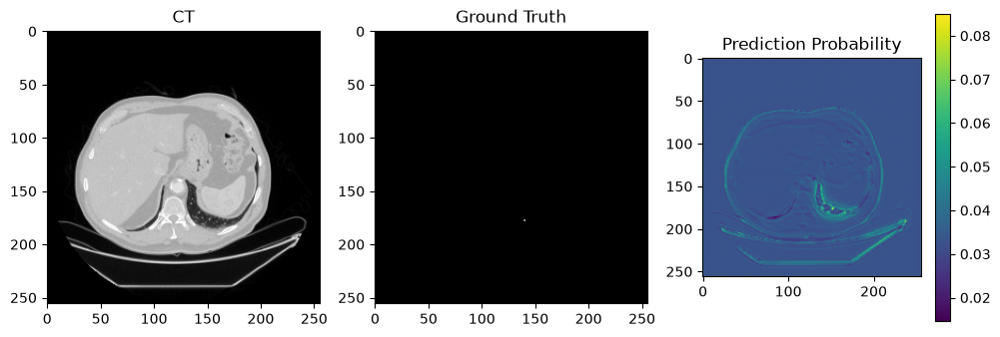

In [47]:
idx = 0

plt.figure(figsize=(12,4))

plt.subplot(131)
plt.imshow(images[idx,:,:,0], cmap="gray")
plt.title("CT")

plt.subplot(132)
plt.imshow(masks[idx,:,:,0], cmap="gray")
plt.title("Ground Truth")

plt.subplot(133)
plt.imshow(predictions[idx,:,:,0], cmap="viridis")
plt.colorbar()
plt.title("Prediction Probability")

plt.show()

In [48]:
TRAIN_POSITIVE_FRACTION = 0.75
TRAIN_STEPS_PER_EPOCH = 500

train_sequence_v2 = BalancedSegmentationSequence(
    positive_df=train_positive_df,
    negative_df=train_negative_df,
    batch_size=BATCH_SIZE,
    positive_fraction=TRAIN_POSITIVE_FRACTION,
    steps_per_epoch=TRAIN_STEPS_PER_EPOCH,
    seed=SEED,
    shuffle=True,
)

X_check, Y_check = train_sequence_v2[0]

positive_count = np.sum(
    Y_check.reshape(Y_check.shape[0], -1).sum(axis=1) > 0
)

print("Positive slices:", positive_count)
print("Negative slices:", BATCH_SIZE - positive_count)

Balanced generator: 6 positive + 2 negative per batch
Positive slices: 6
Negative slices: 2


In [49]:
SMOOTH = 1e-6
PREDICTION_THRESHOLD = 0.50

def foreground_dice(y_true, y_pred, smooth=SMOOTH):
    y_true = tf.cast(y_true >= 0.5, tf.float32)
    y_pred = tf.cast(
        y_pred >= PREDICTION_THRESHOLD,
        tf.float32,
    )

    axes = (1, 2, 3)

    true_area = tf.reduce_sum(y_true, axis=axes)
    pred_area = tf.reduce_sum(y_pred, axis=axes)

    intersection = tf.reduce_sum(
        y_true * y_pred,
        axis=axes,
    )

    dice_per_sample = (
        2.0 * intersection + smooth
    ) / (
        true_area + pred_area + smooth
    )

    foreground_samples = true_area > 0
    foreground_values = tf.boolean_mask(
        dice_per_sample,
        foreground_samples,
    )

    return tf.cond(
        tf.size(foreground_values) > 0,
        lambda: tf.reduce_mean(foreground_values),
        lambda: tf.constant(0.0, dtype=tf.float32),
    )

In [50]:
def tversky_index(
    y_true,
    y_pred,
    alpha=0.30,
    beta=0.70,
    smooth=1e-6,
):
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred, tf.float32)

    axes = (1, 2, 3)

    true_positive = tf.reduce_sum(
        y_true * y_pred,
        axis=axes,
    )

    false_positive = tf.reduce_sum(
        (1.0 - y_true) * y_pred,
        axis=axes,
    )

    false_negative = tf.reduce_sum(
        y_true * (1.0 - y_pred),
        axis=axes,
    )

    score = (
        true_positive + smooth
    ) / (
        true_positive
        + alpha * false_positive
        + beta * false_negative
        + smooth
    )

    return tf.reduce_mean(score)


def focal_tversky_loss(
    y_true,
    y_pred,
    alpha=0.30,
    beta=0.70,
    gamma=0.75,
):
    tversky = tversky_index(
        y_true,
        y_pred,
        alpha=alpha,
        beta=beta,
    )

    return tf.pow(
        1.0 - tversky,
        gamma,
    )

In [51]:
tf.keras.backend.clear_session()

random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

unet_model_v2 = build_unet()

unet_model_v2.compile(
    optimizer=tf.keras.optimizers.Adam(
        learning_rate=1e-4,
    ),
    loss=focal_tversky_loss,
    metrics=[
        dice_coefficient,
        foreground_dice,
        intersection_over_union,
        segmentation_precision,
        segmentation_recall,
        segmentation_specificity,
    ],
)

print("Corrected U-Net compiled.")

Corrected U-Net compiled.


In [52]:
val_positive_sequence = EvaluationSegmentationSequence(
    dataframe=val_positive_df,
    batch_size=BATCH_SIZE,
)

In [53]:
BEST_MODEL_V2_PATH = (
    MODELS_DIR /
    "best_plos_2d_unet_focal_tversky.keras"
)

TRAINING_LOG_V2_PATH = (
    RESULTS_DIR /
    "unet_focal_tversky_training_log.csv"
)

callbacks_v2 = [
    tf.keras.callbacks.ModelCheckpoint(
        filepath=BEST_MODEL_V2_PATH,
        monitor="val_foreground_dice",
        mode="max",
        save_best_only=True,
        verbose=1,
    ),

    tf.keras.callbacks.EarlyStopping(
        monitor="val_foreground_dice",
        mode="max",
        patience=8,
        restore_best_weights=True,
        verbose=1,
    ),

    tf.keras.callbacks.ReduceLROnPlateau(
        monitor="val_foreground_dice",
        mode="max",
        factor=0.5,
        patience=3,
        min_lr=1e-6,
        verbose=1,
    ),

    tf.keras.callbacks.CSVLogger(
        TRAINING_LOG_V2_PATH,
        append=False,
    ),

    tf.keras.callbacks.TerminateOnNaN(),
]

In [54]:
pilot_history = unet_model_v2.fit(
    train_sequence_v2,
    validation_data=val_positive_sequence,
    epochs=5,
    callbacks=callbacks_v2,
    verbose=1,
)

Epoch 1/5
500/500 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - dice_coefficient: 0.0057 - foreground_dice: 0.0348 - intersection_over_union: 0.0155 - loss: 0.9930 - segmentation_precision: 0.0166 - segmentation_recall: 0.8683 - segmentation_specificity: 0.9046
Epoch 1: val_foreground_dice improved from None to 0.10158, saving model to /Volumes/Expansion/PLOS_2D_UNet_Revision/models/best_plos_2d_unet_focal_tversky.keras

Epoch 1: finished saving model to /Volumes/Expansion/PLOS_2D_UNet_Revision/models/best_plos_2d_unet_focal_tversky.keras
500/500 ━━━━━━━━━━━━━━━━━━━━ 1415s 3s/step - dice_coefficient: 0.0057 - foreground_dice: 0.0348 - intersection_over_union: 0.0155 - loss: 0.9930 - segmentation_precision: 0.0166 - segmentation_recall: 0.8683 - segmentation_specificity: 0.9046 - val_dice_coefficient: 0.0130 - val_foreground_dice: 0.1016 - val_intersection_over_union: 0.0616 - val_loss: 0.9840 - val_segmentation_precision: 0.0670 - val_segmentation_recall: 0.7101 - val_segmentation_specificity: 0.9

In [55]:
custom_objects_v2 = {
    "focal_tversky_loss": focal_tversky_loss,
    "tversky_index": tversky_index,
    "dice_coefficient": dice_coefficient,
    "foreground_dice": foreground_dice,
    "intersection_over_union": intersection_over_union,
    "segmentation_precision": segmentation_precision,
    "segmentation_recall": segmentation_recall,
    "segmentation_specificity": segmentation_specificity,
}

unet_model_v2 = tf.keras.models.load_model(
    BEST_MODEL_V2_PATH,
    custom_objects=custom_objects_v2,
)

print("Pilot checkpoint loaded.")

Pilot checkpoint loaded.


In [56]:
FULL_LOG_V2_PATH = (
    RESULTS_DIR /
    "unet_focal_tversky_full_training_log.csv"
)

callbacks_v2_full = [
    tf.keras.callbacks.ModelCheckpoint(
        filepath=BEST_MODEL_V2_PATH,
        monitor="val_foreground_dice",
        mode="max",
        save_best_only=True,
        verbose=1,
    ),

    tf.keras.callbacks.EarlyStopping(
        monitor="val_foreground_dice",
        mode="max",
        patience=8,
        restore_best_weights=True,
        verbose=1,
    ),

    tf.keras.callbacks.ReduceLROnPlateau(
        monitor="val_foreground_dice",
        mode="max",
        factor=0.5,
        patience=3,
        min_lr=1e-6,
        verbose=1,
    ),

    tf.keras.callbacks.CSVLogger(
        FULL_LOG_V2_PATH,
        append=False,
    ),

    tf.keras.callbacks.TerminateOnNaN(),
]

In [57]:
full_history_v2 = unet_model_v2.fit(
    train_sequence_v2,
    validation_data=val_positive_sequence,
    initial_epoch=5,
    epochs=35,
    callbacks=callbacks_v2_full,
    verbose=1,
)

Epoch 6/35
500/500 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - dice_coefficient: 0.3285 - foreground_dice: 0.5063 - intersection_over_union: 0.4057 - loss: 0.7078 - segmentation_precision: 0.5086 - segmentation_recall: 0.7497 - segmentation_specificity: 0.9997
Epoch 6: val_foreground_dice improved from None to 0.38713, saving model to /Volumes/Expansion/PLOS_2D_UNet_Revision/models/best_plos_2d_unet_focal_tversky.keras

Epoch 6: finished saving model to /Volumes/Expansion/PLOS_2D_UNet_Revision/models/best_plos_2d_unet_focal_tversky.keras
500/500 ━━━━━━━━━━━━━━━━━━━━ 1595s 3s/step - dice_coefficient: 0.3285 - foreground_dice: 0.5063 - intersection_over_union: 0.4057 - loss: 0.7078 - segmentation_precision: 0.5086 - segmentation_recall: 0.7497 - segmentation_specificity: 0.9997 - val_dice_coefficient: 0.3535 - val_foreground_dice: 0.3871 - val_intersection_over_union: 0.3116 - val_loss: 0.6966 - val_segmentation_precision: 0.6764 - val_segmentation_recall: 0.4172 - val_segmentation_specificity: 0.

In [58]:
best_model_v2 = tf.keras.models.load_model(
    BEST_MODEL_V2_PATH,
    custom_objects=custom_objects_v2,
)

positive_test_results_v2 = best_model_v2.evaluate(
    test_positive_sequence,
    return_dict=True,
    verbose=1,
)

print("\nPositive test results:")

for name, value in positive_test_results_v2.items():
    print(f"{name}: {value:.6f}")

143/143 ━━━━━━━━━━━━━━━━━━━━ 177s 1s/step - dice_coefficient: 0.4321 - foreground_dice: 0.4377 - intersection_over_union: 0.3525 - loss: 0.6285 - segmentation_precision: 0.5794 - segmentation_recall: 0.5001 - segmentation_specificity: 0.9998

Positive test results:
dice_coefficient: 0.432083
foreground_dice: 0.437719
intersection_over_union: 0.352499
loss: 0.628547
segmentation_precision: 0.579354
segmentation_recall: 0.500099
segmentation_specificity: 0.999847


In [59]:
natural_test_results_v2 = best_model_v2.evaluate(
    test_sequence,
    return_dict=True,
    verbose=1,
)

print("\nNatural-distribution test results:")

for name, value in natural_test_results_v2.items():
    print(f"{name}: {value:.6f}")

2112/2112 ━━━━━━━━━━━━━━━━━━━━ 2487s 1s/step - dice_coefficient: 0.0292 - foreground_dice: 0.0566 - intersection_over_union: 0.4746 - loss: 0.9756 - segmentation_precision: 0.4899 - segmentation_recall: 0.9662 - segmentation_specificity: 0.9999

Natural-distribution test results:
dice_coefficient: 0.029173
foreground_dice: 0.056635
intersection_over_union: 0.474551
loss: 0.975609
segmentation_precision: 0.489884
segmentation_recall: 0.966183
segmentation_specificity: 0.999891


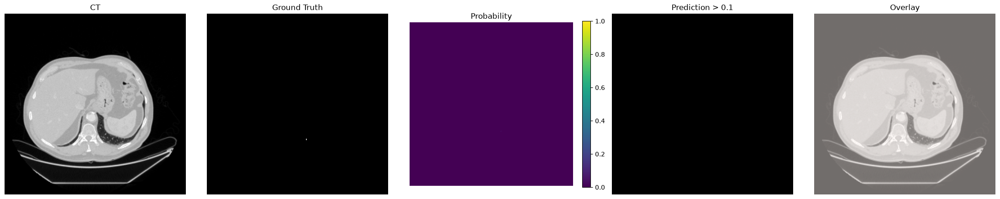

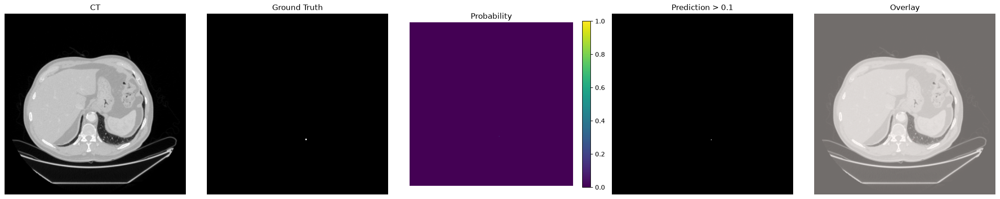

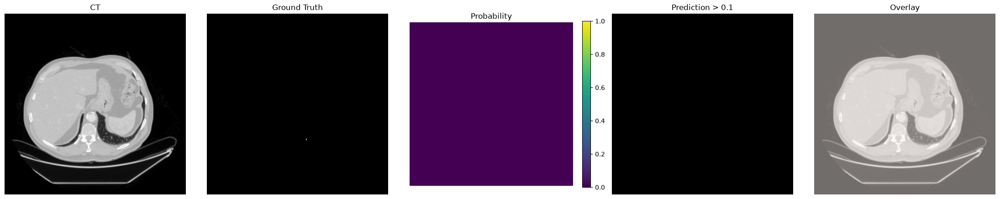

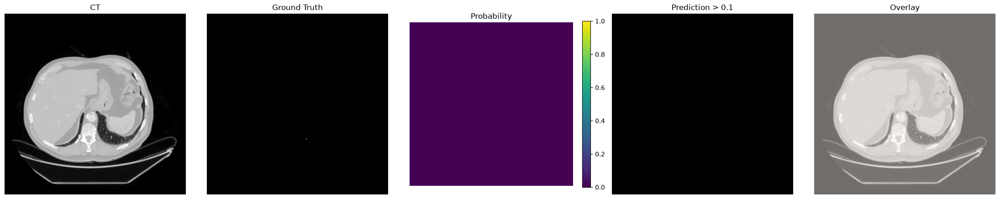

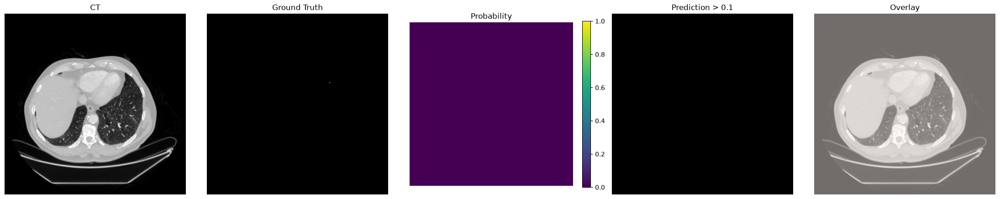

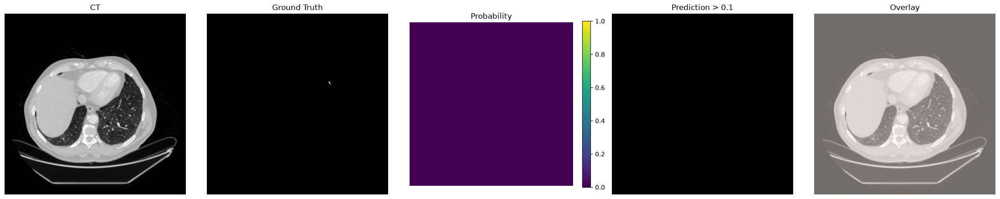

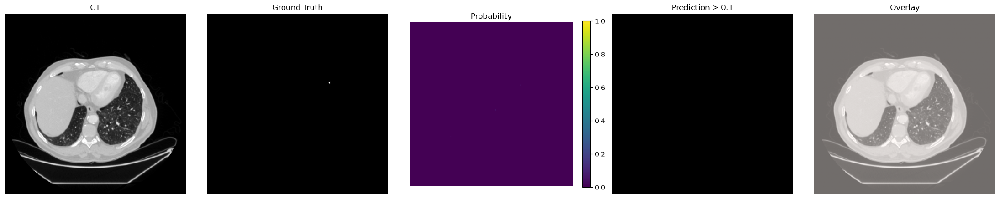

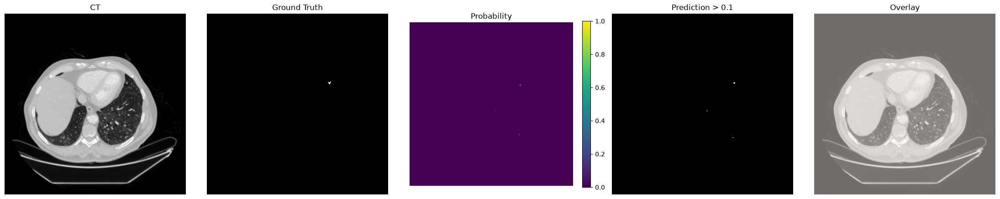

In [64]:
# ============================================================
# Visualize Predictions
# ============================================================

import matplotlib.pyplot as plt
import numpy as np

# Load one batch
images, masks = test_positive_sequence[0]

# Predict probabilities
predictions = best_model_v2.predict(images, verbose=0)

# Threshold
threshold = 0.1
pred_binary = (predictions > threshold).astype(np.float32)

# Number of examples to display
n_examples = min(20, len(images))

for i in range(n_examples):

    fig, ax = plt.subplots(1, 5, figsize=(22,5))

    # ---------------------------------------------------
    # CT
    # ---------------------------------------------------
    ax[0].imshow(images[i,:,:,0], cmap="gray")
    ax[0].set_title("CT")
    ax[0].axis("off")

    # ---------------------------------------------------
    # Ground Truth
    # ---------------------------------------------------
    ax[1].imshow(masks[i,:,:,0], cmap="gray")
    ax[1].set_title("Ground Truth")
    ax[1].axis("off")

    # ---------------------------------------------------
    # Prediction Probability
    # ---------------------------------------------------
    im = ax[2].imshow(predictions[i,:,:,0],
                      cmap="viridis",
                      vmin=0,
                      vmax=1)

    ax[2].set_title("Probability")
    ax[2].axis("off")

    plt.colorbar(im, ax=ax[2], fraction=0.046)

    # ---------------------------------------------------
    # Binary Prediction
    # ---------------------------------------------------
    ax[3].imshow(pred_binary[i,:,:,0], cmap="gray")
    ax[3].set_title(f"Prediction > {threshold}")
    ax[3].axis("off")

    # ---------------------------------------------------
    # Overlay
    # ---------------------------------------------------
    ax[4].imshow(images[i,:,:,0], cmap="gray")
    ax[4].imshow(pred_binary[i,:,:,0],
                 cmap="Reds",
                 alpha=0.45)

    ax[4].set_title("Overlay")
    ax[4].axis("off")

    plt.tight_layout()
    plt.show()

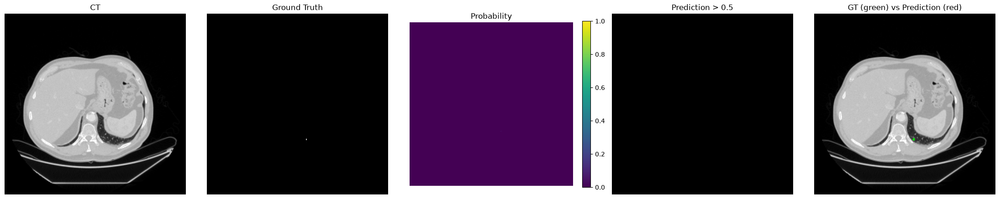

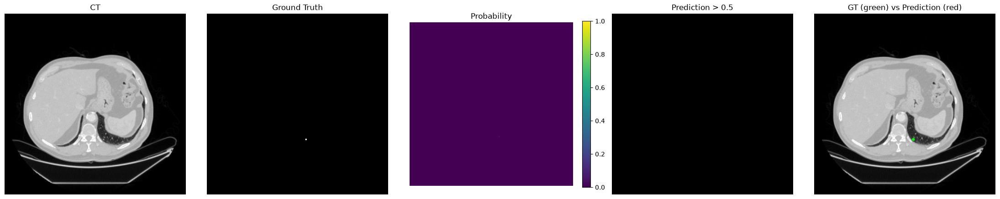

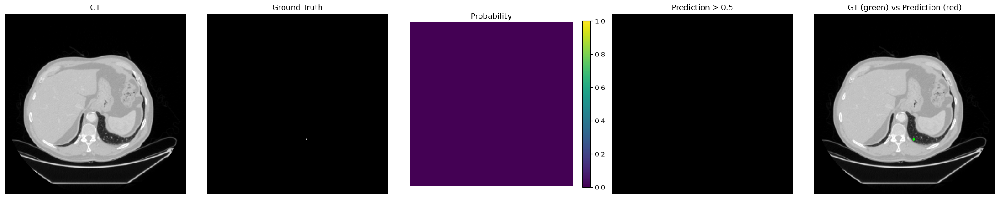

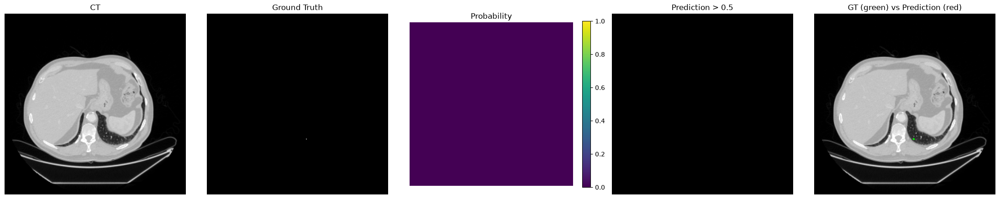

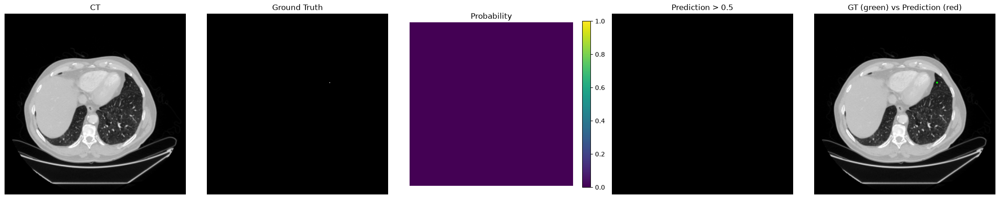

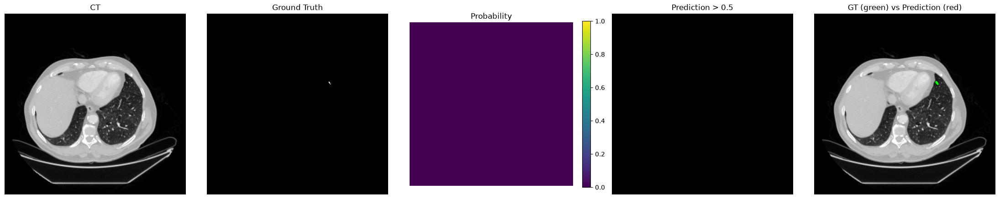

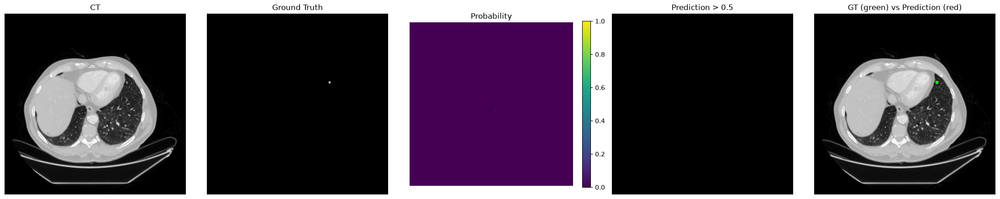

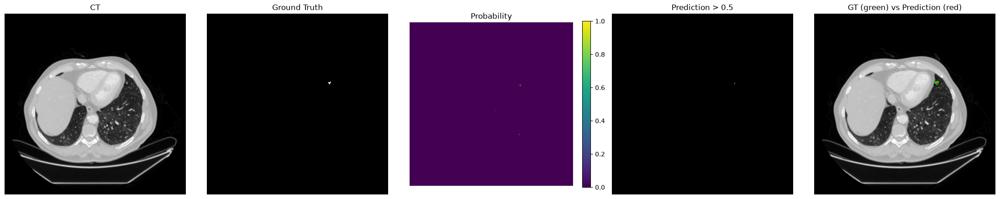

In [62]:
# ============================================================
# Visualize Predictions
# ============================================================

import matplotlib.pyplot as plt
import numpy as np

# Load one batch
images, masks = test_positive_sequence[0]

# Predict probabilities
predictions = best_model_v2.predict(images, verbose=0)

# Threshold
threshold = 0.5
pred_binary = (predictions > threshold).astype(np.float32)

# Number of examples to display
n_examples = min(20, len(images))

for i in range(n_examples):

    fig, ax = plt.subplots(1, 5, figsize=(22,5))

    # ---------------------------------------------------
    # CT
    # ---------------------------------------------------
    ax[0].imshow(images[i,:,:,0], cmap="gray")
    ax[0].set_title("CT")
    ax[0].axis("off")

    # ---------------------------------------------------
    # Ground Truth
    # ---------------------------------------------------
    ax[1].imshow(masks[i,:,:,0], cmap="gray")
    ax[1].set_title("Ground Truth")
    ax[1].axis("off")

    # ---------------------------------------------------
    # Prediction Probability
    # ---------------------------------------------------
    im = ax[2].imshow(predictions[i,:,:,0],
                      cmap="viridis",
                      vmin=0,
                      vmax=1)

    ax[2].set_title("Probability")
    ax[2].axis("off")

    plt.colorbar(im, ax=ax[2], fraction=0.046)

    # ---------------------------------------------------
    # Binary Prediction
    # ---------------------------------------------------
    ax[3].imshow(pred_binary[i,:,:,0], cmap="gray")
    ax[3].set_title(f"Prediction > {threshold}")
    ax[3].axis("off")

    # ---------------------------------------------------
    # Overlay
    # ---------------------------------------------------
    ax[4].imshow(images[i,:,:,0], cmap="gray")

    # Ground truth in green
    ax[4].contour(
    masks[i,:,:,0],
    levels=[0.5],
    colors="lime",
    linewidths=2
    )

# Prediction in red
    ax[4].contour(
    pred_binary[i,:,:,0],
    levels=[0.5],
    colors="red",
    linewidths=2
    )

    ax[4].set_title("GT (green) vs Prediction (red)")
    ax[4].axis("off")

    plt.tight_layout()
    plt.show()

In [65]:
# ============================================================
# Per-slice evaluation for 20 positive test examples
# ============================================================

import numpy as np
import pandas as pd

THRESHOLD = 0.10
N_EXAMPLES = 20
SMOOTH = 1e-6

images, masks = test_positive_sequence[0]
predictions = best_model_v2.predict(images, verbose=0)

n_examples = min(
    N_EXAMPLES,
    len(images),
)

rows = []

for i in range(n_examples):

    gt = masks[i, :, :, 0].astype(np.uint8)
    prob = predictions[i, :, :, 0].astype(np.float32)
    pred = (prob >= THRESHOLD).astype(np.uint8)

    intersection = np.sum(gt * pred)

    gt_pixels = int(np.sum(gt))
    pred_pixels = int(np.sum(pred))

    union = (
        gt_pixels
        + pred_pixels
        - intersection
    )

    dice = (
        2.0 * intersection + SMOOTH
    ) / (
        gt_pixels + pred_pixels + SMOOTH
    )

    iou = (
        intersection + SMOOTH
    ) / (
        union + SMOOTH
    )

    true_positive = int(
        np.sum((gt == 1) & (pred == 1))
    )

    false_positive = int(
        np.sum((gt == 0) & (pred == 1))
    )

    false_negative = int(
        np.sum((gt == 1) & (pred == 0))
    )

    precision = (
        true_positive + SMOOTH
    ) / (
        true_positive
        + false_positive
        + SMOOTH
    )

    recall = (
        true_positive + SMOOTH
    ) / (
        true_positive
        + false_negative
        + SMOOTH
    )

    inside_probabilities = prob[gt > 0]

    mean_probability_inside_gt = (
        float(inside_probabilities.mean())
        if inside_probabilities.size > 0
        else np.nan
    )

    max_probability_inside_gt = (
        float(inside_probabilities.max())
        if inside_probabilities.size > 0
        else np.nan
    )

    rows.append({
        "example": i,
        "threshold": THRESHOLD,
        "gt_pixels": gt_pixels,
        "predicted_pixels": pred_pixels,
        "intersection_pixels": int(intersection),
        "prediction_max": float(prob.max()),
        "prediction_mean": float(prob.mean()),
        "mean_probability_inside_gt": (
            mean_probability_inside_gt
        ),
        "max_probability_inside_gt": (
            max_probability_inside_gt
        ),
        "dice": float(dice),
        "iou": float(iou),
        "precision": float(precision),
        "recall": float(recall),
        "detected": bool(true_positive > 0),
    })

per_slice_results = pd.DataFrame(rows)

per_slice_results

,example,threshold,gt_pixels,predicted_pixels,intersection_pixels,prediction_max,prediction_mean,mean_probability_inside_gt,max_probability_inside_gt,dice,iou,precision,recall,detected
0,0,0.1,2,0,0,0.044057,0.000007,0.000010,0.000020,4.999998e-07,4.999998e-07,1.000000,4.999998e-07,False
1,1,0.1,4,1,1,0.108052,0.000008,0.032063,0.108052,4.000001e-01,2.500002e-01,1.000000,2.500002e-01,True
2,2,0.1,2,0,0,0.007473,0.000006,0.001406,0.002177,4.999998e-07,4.999998e-07,1.000000,4.999998e-07,False
3,3,0.1,1,0,0,0.002010,0.000006,0.000032,0.000032,9.999990e-07,9.999990e-07,1.000000,9.999990e-07,False
4,4,0.1,1,0,0,0.005290,0.000005,0.000033,0.000033,9.999990e-07,9.999990e-07,1.000000,9.999990e-07,False
5,5,0.1,5,0,0,0.005463,0.000005,0.000032,0.000080,2.000000e-07,2.000000e-07,1.000000,2.000000e-07,False
6,6,0.1,6,0,0,0.068709,0.000010,0.010010,0.030604,1.666666e-07,1.666666e-07,1.000000,1.666666e-07,False
7,7,0.1,8,6,4,0.935046,0.000044,0.195247,0.935046,5.714286e-01,4.000001e-01,0.666667,5.000001e-01,True


In [66]:
# ============================================================
# Summary of the 20 evaluated slices
# ============================================================

print("Threshold:", THRESHOLD)
print("Examples evaluated:", len(per_slice_results))

print(
    "Detected slices:",
    int(per_slice_results["detected"].sum()),
)

print(
    "Missed slices:",
    int((~per_slice_results["detected"]).sum()),
)

print(
    "Mean Dice:",
    per_slice_results["dice"].mean(),
)

print(
    "Median Dice:",
    per_slice_results["dice"].median(),
)

print(
    "Mean IoU:",
    per_slice_results["iou"].mean(),
)

print(
    "Mean recall:",
    per_slice_results["recall"].mean(),
)

print(
    "Mean precision:",
    per_slice_results["precision"].mean(),
)

Threshold: 0.1
Examples evaluated: 8
Detected slices: 2
Missed slices: 6
Mean Dice: 0.12142901108811113
Median Dice: 7.499993750005625e-07
Mean IoU: 0.08125045177050574
Mean recall: 0.09375045208300553
Mean precision: 0.9583333402777766


In [67]:
# ============================================================
# Best, median, and worst cases
# ============================================================

ranked_results = (
    per_slice_results
    .sort_values("dice")
    .reset_index(drop=True)
)

worst_example = int(
    ranked_results.iloc[0]["example"]
)

median_example = int(
    ranked_results.iloc[
        len(ranked_results) // 2
    ]["example"]
)

best_example = int(
    ranked_results.iloc[-1]["example"]
)

print("Worst example:", worst_example)
print("Median example:", median_example)
print("Best example:", best_example)

display(
    per_slice_results.loc[
        per_slice_results["example"].isin(
            [
                worst_example,
                median_example,
                best_example,
            ]
        )
    ].sort_values("dice")
)

Worst example: 6
Median example: 3
Best example: 7


,example,threshold,gt_pixels,predicted_pixels,intersection_pixels,prediction_max,prediction_mean,mean_probability_inside_gt,max_probability_inside_gt,dice,iou,precision,recall,detected
6,6,0.1,6,0,0,0.068709,0.000010,0.010010,0.030604,1.666666e-07,1.666666e-07,1.000000,1.666666e-07,False
3,3,0.1,1,0,0,0.002010,0.000006,0.000032,0.000032,9.999990e-07,9.999990e-07,1.000000,9.999990e-07,False
7,7,0.1,8,6,4,0.935046,0.000044,0.195247,0.935046,5.714286e-01,4.000001e-01,0.666667,5.000001e-01,True


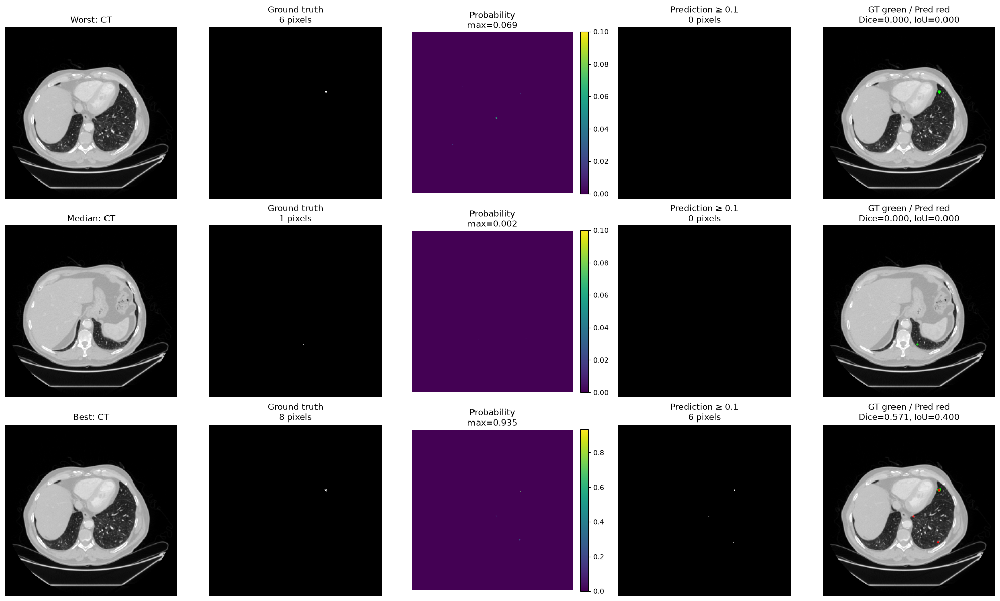

In [68]:
# ============================================================
# Visualize worst, median, and best cases
# ============================================================

import matplotlib.pyplot as plt

selected_examples = [
    ("Worst", worst_example),
    ("Median", median_example),
    ("Best", best_example),
]

fig, axes = plt.subplots(
    3,
    5,
    figsize=(20, 12),
)

for row_index, (label, idx) in enumerate(
    selected_examples
):

    image = images[idx, :, :, 0]
    gt = masks[idx, :, :, 0]
    probability = predictions[idx, :, :, 0]
    binary_prediction = (
        probability >= THRESHOLD
    ).astype(np.uint8)

    result_row = (
        per_slice_results[
            per_slice_results["example"] == idx
        ]
        .iloc[0]
    )

    axes[row_index, 0].imshow(
        image,
        cmap="gray",
    )
    axes[row_index, 0].set_title(
        f"{label}: CT"
    )

    axes[row_index, 1].imshow(
        gt,
        cmap="gray",
        vmin=0,
        vmax=1,
    )
    axes[row_index, 1].set_title(
        f"Ground truth\n"
        f"{int(result_row['gt_pixels'])} pixels"
    )

    probability_plot = axes[
        row_index,
        2
    ].imshow(
        probability,
        cmap="viridis",
        vmin=0,
        vmax=max(
            float(probability.max()),
            THRESHOLD,
        ),
    )

    axes[row_index, 2].set_title(
        f"Probability\n"
        f"max={result_row['prediction_max']:.3f}"
    )

    fig.colorbar(
        probability_plot,
        ax=axes[row_index, 2],
        fraction=0.046,
        pad=0.04,
    )

    axes[row_index, 3].imshow(
        binary_prediction,
        cmap="gray",
        vmin=0,
        vmax=1,
    )
    axes[row_index, 3].set_title(
        f"Prediction ≥ {THRESHOLD}\n"
        f"{int(result_row['predicted_pixels'])} pixels"
    )

    axes[row_index, 4].imshow(
        image,
        cmap="gray",
    )

    if np.any(gt > 0):
        axes[row_index, 4].contour(
            gt,
            levels=[0.5],
            colors="lime",
            linewidths=2,
        )

    if np.any(binary_prediction > 0):
        axes[row_index, 4].contour(
            binary_prediction,
            levels=[0.5],
            colors="red",
            linewidths=2,
        )

    axes[row_index, 4].set_title(
        f"GT green / Pred red\n"
        f"Dice={result_row['dice']:.3f}, "
        f"IoU={result_row['iou']:.3f}"
    )

    for column_index in range(5):
        axes[row_index, column_index].axis(
            "off"
        )

plt.tight_layout()
plt.show()

In [69]:
per_slice_results_path = (
    RESULTS_DIR /
    "first_20_positive_test_slice_metrics_threshold_010.csv"
)

per_slice_results.to_csv(
    per_slice_results_path,
    index=False,
)

print("Saved to:")
print(per_slice_results_path)

Saved to:
/Volumes/Expansion/PLOS_2D_UNet_Revision/results/first_20_positive_test_slice_metrics_threshold_010.csv


In [70]:
largest = (
    test_df
    .sort_values("mask_pixels", ascending=False)
)

largest.head(20)

,patient_id,scan_id,split,npz_path,slice_index,is_positive,mask_pixels
8400,LIDC-IDRI-0493,499,test,/Volumes/Expansion/PLOS_2D_UNet_Revision/proce...,132,True,301
15496,LIDC-IDRI-0910,745,test,/Volumes/Expansion/PLOS_2D_UNet_Revision/proce...,49,True,296
15495,LIDC-IDRI-0910,745,test,/Volumes/Expansion/PLOS_2D_UNet_Revision/proce...,48,True,295
8399,LIDC-IDRI-0493,499,test,/Volumes/Expansion/PLOS_2D_UNet_Revision/proce...,131,True,287
8401,LIDC-IDRI-0493,499,test,/Volumes/Expansion/PLOS_2D_UNet_Revision/proce...,133,True,281
8397,LIDC-IDRI-0493,499,test,/Volumes/Expansion/PLOS_2D_UNet_Revision/proce...,129,True,278
8398,LIDC-IDRI-0493,499,test,/Volumes/Expansion/PLOS_2D_UNet_Revision/proce...,130,True,274
8402,LIDC-IDRI-0493,499,test,/Volumes/Expansion/PLOS_2D_UNet_Revision/proce...,134,True,273
13448,LIDC-IDRI-0703,952,test,/Volumes/Expansion/PLOS_2D_UNet_Revision/proce...,163,True,269
15494,LIDC-IDRI-0910,745,test,/Volumes/Expansion/PLOS_2D_UNet_Revision/proce...,47,True,268


In [71]:
TOP_N = 20

largest_df = (
    test_df[test_df["is_positive"]]
    .sort_values("mask_pixels", ascending=False)
    .head(TOP_N)
)

largest_df

,patient_id,scan_id,split,npz_path,slice_index,is_positive,mask_pixels
8400,LIDC-IDRI-0493,499,test,/Volumes/Expansion/PLOS_2D_UNet_Revision/proce...,132,True,301
15496,LIDC-IDRI-0910,745,test,/Volumes/Expansion/PLOS_2D_UNet_Revision/proce...,49,True,296
15495,LIDC-IDRI-0910,745,test,/Volumes/Expansion/PLOS_2D_UNet_Revision/proce...,48,True,295
8399,LIDC-IDRI-0493,499,test,/Volumes/Expansion/PLOS_2D_UNet_Revision/proce...,131,True,287
8401,LIDC-IDRI-0493,499,test,/Volumes/Expansion/PLOS_2D_UNet_Revision/proce...,133,True,281
8397,LIDC-IDRI-0493,499,test,/Volumes/Expansion/PLOS_2D_UNet_Revision/proce...,129,True,278
8398,LIDC-IDRI-0493,499,test,/Volumes/Expansion/PLOS_2D_UNet_Revision/proce...,130,True,274
8402,LIDC-IDRI-0493,499,test,/Volumes/Expansion/PLOS_2D_UNet_Revision/proce...,134,True,273
13448,LIDC-IDRI-0703,952,test,/Volumes/Expansion/PLOS_2D_UNet_Revision/proce...,163,True,269
15494,LIDC-IDRI-0910,745,test,/Volumes/Expansion/PLOS_2D_UNet_Revision/proce...,47,True,268


In [72]:
import numpy as np

npz_lookup = {
    row.npz_path: i
    for i, row in test_df.reset_index(drop=True).iterrows()
}

In [74]:
npz = np.load(largest_df.iloc[0].npz_path)

print(npz.files)

['volume_hu', 'volume_normalized', 'consensus_mask', 'positive_slice_indices', 'consensus_level', 'patient_id', 'scan_id', 'split']


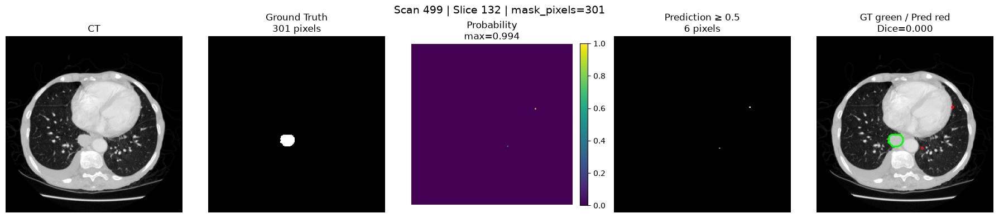

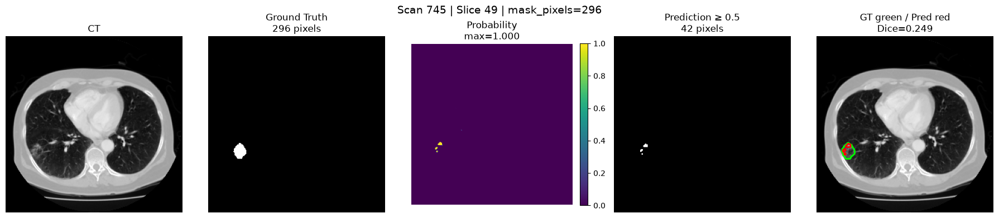

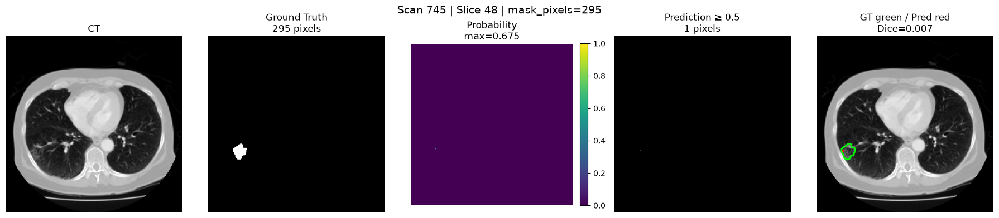

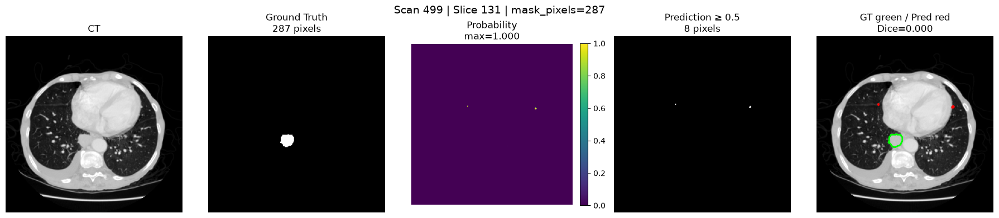

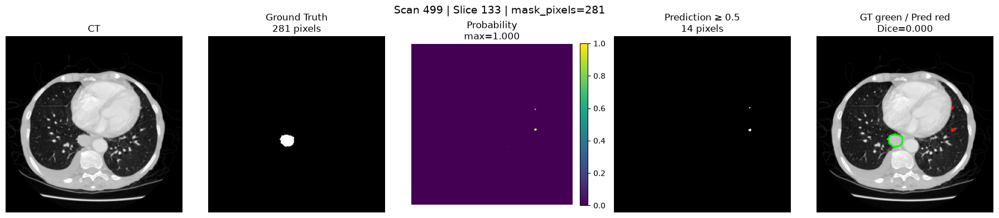

...

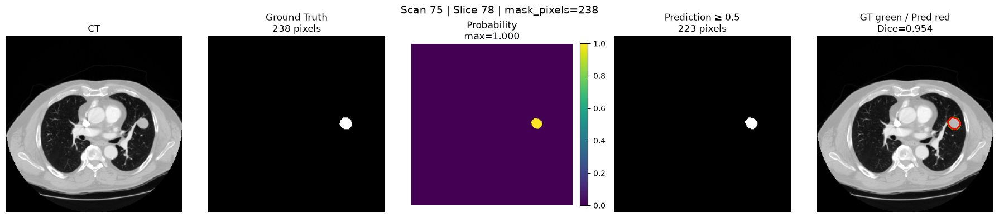

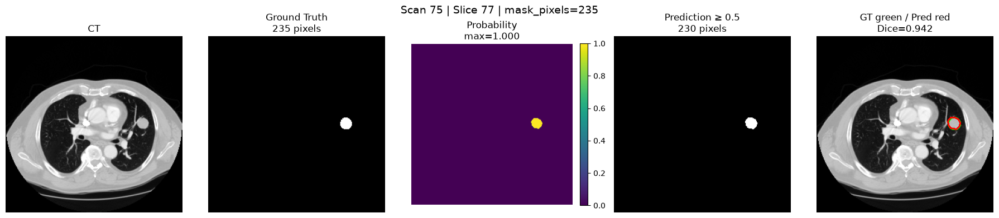

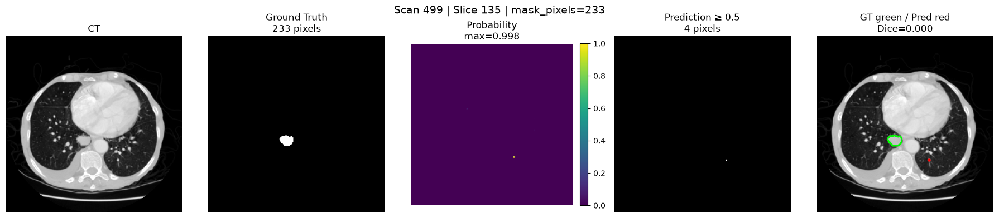

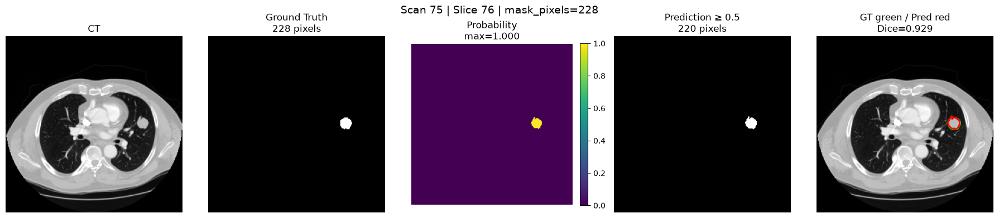

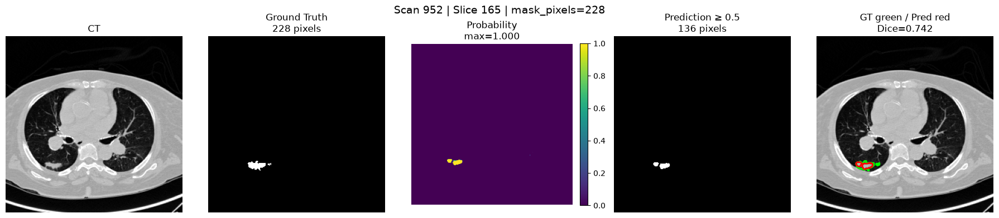

In [76]:
THRESHOLD = 0.5

for _, row in largest_df.iterrows():

    with np.load(row.npz_path) as npz:

        volume = npz["volume_normalized"]
        mask_volume = npz["consensus_mask"]

        slice_idx = int(row.slice_index)

        # Volume organization: height × width × slices
        image = volume[:, :, slice_idx]
        mask = mask_volume[:, :, slice_idx]

    # Confirm the selected slice is 256 × 256
    if image.shape != (256, 256):
        raise ValueError(
            f"Unexpected image shape {image.shape} "
            f"for scan {row.scan_id}, slice {slice_idx}"
        )

    if mask.shape != (256, 256):
        raise ValueError(
            f"Unexpected mask shape {mask.shape} "
            f"for scan {row.scan_id}, slice {slice_idx}"
        )

    image = image.astype(np.float32)[..., np.newaxis]
    mask = mask.astype(np.float32)[..., np.newaxis]

    prediction = best_model_v2.predict(
        image[np.newaxis, ...],
        verbose=0,
    )[0]

    binary = (
        prediction >= THRESHOLD
    ).astype(np.uint8)

    gt_pixels = int(mask.sum())
    predicted_pixels = int(binary.sum())
    intersection = int(
        np.logical_and(
            mask[:, :, 0] > 0.5,
            binary[:, :, 0] > 0,
        ).sum()
    )

    dice = (
        2.0 * intersection
        /
        (gt_pixels + predicted_pixels)
        if gt_pixels + predicted_pixels > 0
        else 1.0
    )

    fig, ax = plt.subplots(
        1,
        5,
        figsize=(18, 4),
    )

    ax[0].imshow(
        image[:, :, 0],
        cmap="gray",
    )
    ax[0].set_title("CT")

    ax[1].imshow(
        mask[:, :, 0],
        cmap="gray",
        vmin=0,
        vmax=1,
    )
    ax[1].set_title(
        f"Ground Truth\n{gt_pixels} pixels"
    )

    probability_plot = ax[2].imshow(
        prediction[:, :, 0],
        cmap="viridis",
        vmin=0,
        vmax=1,
    )
    ax[2].set_title(
        f"Probability\n"
        f"max={prediction.max():.3f}"
    )

    fig.colorbar(
        probability_plot,
        ax=ax[2],
        fraction=0.046,
        pad=0.04,
    )

    ax[3].imshow(
        binary[:, :, 0],
        cmap="gray",
        vmin=0,
        vmax=1,
    )
    ax[3].set_title(
        f"Prediction ≥ {THRESHOLD}\n"
        f"{predicted_pixels} pixels"
    )

    ax[4].imshow(
        image[:, :, 0],
        cmap="gray",
    )

    if np.any(mask[:, :, 0] > 0):
        ax[4].contour(
            mask[:, :, 0],
            levels=[0.5],
            colors="lime",
            linewidths=2,
        )

    if np.any(binary[:, :, 0] > 0):
        ax[4].contour(
            binary[:, :, 0],
            levels=[0.5],
            colors="red",
            linewidths=2,
        )

    ax[4].set_title(
        f"GT green / Pred red\n"
        f"Dice={dice:.3f}"
    )

    for axis in ax:
        axis.axis("off")

    plt.suptitle(
        f"Scan {row.scan_id} | "
        f"Slice {slice_idx} | "
        f"mask_pixels={row.mask_pixels}",
        fontsize=14,
    )

    plt.tight_layout()
    plt.show()

In [77]:
# ============================================================
# Threshold optimization — collect validation predictions
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

validation_images = []
validation_masks = []
validation_probabilities = []

for batch_index in range(len(val_positive_sequence)):

    images_batch, masks_batch = val_positive_sequence[batch_index]

    probabilities_batch = best_model_v2.predict(
        images_batch,
        verbose=0,
    )

    validation_images.append(images_batch)
    validation_masks.append(masks_batch)
    validation_probabilities.append(probabilities_batch)

validation_images = np.concatenate(
    validation_images,
    axis=0,
)

validation_masks = np.concatenate(
    validation_masks,
    axis=0,
)

validation_probabilities = np.concatenate(
    validation_probabilities,
    axis=0,
)

print("Validation images:", validation_images.shape)
print("Validation masks:", validation_masks.shape)
print(
    "Validation probabilities:",
    validation_probabilities.shape,
)

assert validation_images.shape == validation_masks.shape
assert validation_masks.shape == validation_probabilities.shape

Validation images: (1195, 256, 256, 1)
Validation masks: (1195, 256, 256, 1)
Validation probabilities: (1195, 256, 256, 1)


In [78]:
# ============================================================
# Per-slice segmentation metrics
# ============================================================

EPSILON = 1e-7


def calculate_slice_metrics(
    ground_truth,
    probability,
    threshold,
):
    """
    Calculate binary segmentation metrics for one positive slice.
    """

    ground_truth = (
        ground_truth >= 0.5
    ).astype(np.uint8)

    prediction = (
        probability >= threshold
    ).astype(np.uint8)

    true_positive = int(
        np.logical_and(
            ground_truth == 1,
            prediction == 1,
        ).sum()
    )

    false_positive = int(
        np.logical_and(
            ground_truth == 0,
            prediction == 1,
        ).sum()
    )

    false_negative = int(
        np.logical_and(
            ground_truth == 1,
            prediction == 0,
        ).sum()
    )

    true_negative = int(
        np.logical_and(
            ground_truth == 0,
            prediction == 0,
        ).sum()
    )

    ground_truth_pixels = int(
        ground_truth.sum()
    )

    predicted_pixels = int(
        prediction.sum()
    )

    dice = (
        2.0 * true_positive
        /
        (
            2.0 * true_positive
            + false_positive
            + false_negative
            + EPSILON
        )
    )

    iou = (
        true_positive
        /
        (
            true_positive
            + false_positive
            + false_negative
            + EPSILON
        )
    )

    precision = (
        true_positive
        /
        (
            true_positive
            + false_positive
            + EPSILON
        )
    )

    recall = (
        true_positive
        /
        (
            true_positive
            + false_negative
            + EPSILON
        )
    )

    specificity = (
        true_negative
        /
        (
            true_negative
            + false_positive
            + EPSILON
        )
    )

    return {
        "dice": dice,
        "iou": iou,
        "precision": precision,
        "recall": recall,
        "specificity": specificity,
        "ground_truth_pixels": ground_truth_pixels,
        "predicted_pixels": predicted_pixels,
        "true_positive_pixels": true_positive,
        "false_positive_pixels": false_positive,
        "false_negative_pixels": false_negative,
        "detected": true_positive > 0,
    }

In [79]:
# ============================================================
# Validation threshold sweep
# ============================================================

thresholds = np.round(
    np.arange(0.05, 0.91, 0.05),
    2,
)

threshold_summary_rows = []
threshold_slice_rows = []

for threshold in thresholds:

    slice_metrics = []

    for slice_index in range(
        len(validation_masks)
    ):

        ground_truth = validation_masks[
            slice_index,
            :, :,
            0,
        ]

        probability = validation_probabilities[
            slice_index,
            :, :,
            0,
        ]

        metrics = calculate_slice_metrics(
            ground_truth=ground_truth,
            probability=probability,
            threshold=float(threshold),
        )

        metrics["slice_index"] = slice_index
        metrics["threshold"] = float(threshold)

        slice_metrics.append(metrics)
        threshold_slice_rows.append(metrics)

    metrics_df = pd.DataFrame(
        slice_metrics
    )

    threshold_summary_rows.append({
        "threshold": float(threshold),
        "mean_dice": metrics_df["dice"].mean(),
        "median_dice": metrics_df["dice"].median(),
        "mean_iou": metrics_df["iou"].mean(),
        "mean_precision": metrics_df["precision"].mean(),
        "mean_recall": metrics_df["recall"].mean(),
        "mean_specificity": metrics_df["specificity"].mean(),
        "detected_slices": int(
            metrics_df["detected"].sum()
        ),
        "detection_rate": metrics_df["detected"].mean(),
        "mean_predicted_pixels": (
            metrics_df["predicted_pixels"].mean()
        ),
    })

threshold_summary_df = pd.DataFrame(
    threshold_summary_rows
)

validation_threshold_details_df = pd.DataFrame(
    threshold_slice_rows
)

threshold_summary_df

,threshold,mean_dice,median_dice,mean_iou,mean_precision,mean_recall,mean_specificity,detected_slices,detection_rate,mean_predicted_pixels
0,0.05,0.408884,0.417476,0.322571,0.411596,0.518145,0.999688,842,0.704603,44.785774
1,0.10,0.408348,0.421053,0.323664,0.418747,0.505480,0.999709,828,0.692887,43.065272
2,0.15,0.408647,0.428571,0.324917,0.423826,0.498391,0.999721,821,0.687029,42.085356
3,0.20,0.407913,0.428571,0.324825,0.423955,0.493090,0.999729,809,0.676987,41.421757
4,0.25,0.408728,0.430769,0.326077,0.426098,0.490123,0.999736,806,0.674477,40.840167
5,0.30,0.408846,0.432432,0.326682,0.427662,0.486187,0.999742,800,0.669456,40.361506
6,0.35,0.407979,0.431373,0.326021,0.428634,0.482086,0.999747,797,0.666946,39.954812
7,0.40,0.408288,0.428571,0.326765,0.431380,0.479184,0.999751,794,0.664435,39.584100
8,0.45,0.408098,0.428571,0.326816,0.431514,0.476717,0.999755,790,0.661088,39.244351
9,0.50,0.407939,0.422535,0.326764,0.432931,0.474117,0.999759,787,0.658577,38.904603


In [80]:
# ============================================================
# Select optimal validation threshold
# ============================================================

best_threshold_row = (
    threshold_summary_df
    .sort_values(
        [
            "mean_dice",
            "mean_iou",
        ],
        ascending=False,
    )
    .iloc[0]
)

OPTIMAL_THRESHOLD = float(
    best_threshold_row["threshold"]
)

print("Optimal validation threshold:")
print(OPTIMAL_THRESHOLD)

print("\nValidation performance at selected threshold:")

for column in [
    "mean_dice",
    "median_dice",
    "mean_iou",
    "mean_precision",
    "mean_recall",
    "mean_specificity",
    "detection_rate",
]:
    print(
        f"{column}: "
        f"{best_threshold_row[column]:.6f}"
    )

Optimal validation threshold:
0.05

Validation performance at selected threshold:
mean_dice: 0.408884
median_dice: 0.417476
mean_iou: 0.322571
mean_precision: 0.411596
mean_recall: 0.518145
mean_specificity: 0.999688
detection_rate: 0.704603


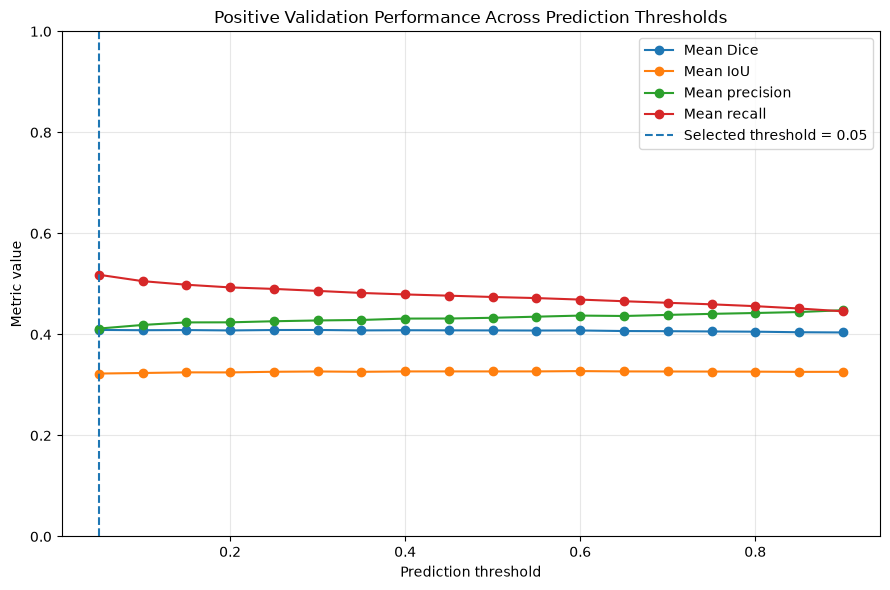

Figure saved to:
/Volumes/Expansion/PLOS_2D_UNet_Revision/figures/validation_threshold_optimization.png


In [81]:
# ============================================================
# Threshold optimization figure
# ============================================================

plt.figure(figsize=(9, 6))

plt.plot(
    threshold_summary_df["threshold"],
    threshold_summary_df["mean_dice"],
    marker="o",
    label="Mean Dice",
)

plt.plot(
    threshold_summary_df["threshold"],
    threshold_summary_df["mean_iou"],
    marker="o",
    label="Mean IoU",
)

plt.plot(
    threshold_summary_df["threshold"],
    threshold_summary_df["mean_precision"],
    marker="o",
    label="Mean precision",
)

plt.plot(
    threshold_summary_df["threshold"],
    threshold_summary_df["mean_recall"],
    marker="o",
    label="Mean recall",
)

plt.axvline(
    OPTIMAL_THRESHOLD,
    linestyle="--",
    label=(
        f"Selected threshold = "
        f"{OPTIMAL_THRESHOLD:.2f}"
    ),
)

plt.xlabel("Prediction threshold")
plt.ylabel("Metric value")
plt.title(
    "Positive Validation Performance "
    "Across Prediction Thresholds"
)
plt.ylim(0, 1)
plt.grid(alpha=0.3)
plt.legend()
plt.tight_layout()

threshold_figure_path = (
    FIGURES_DIR /
    "validation_threshold_optimization.png"
)

plt.savefig(
    threshold_figure_path,
    dpi=300,
    bbox_inches="tight",
)

plt.show()

print("Figure saved to:")
print(threshold_figure_path)

In [82]:
# ============================================================
# Save validation threshold results
# ============================================================

threshold_summary_path = (
    RESULTS_DIR /
    "validation_threshold_summary.csv"
)

threshold_details_path = (
    RESULTS_DIR /
    "validation_threshold_slice_metrics.csv"
)

threshold_summary_df.to_csv(
    threshold_summary_path,
    index=False,
)

validation_threshold_details_df.to_csv(
    threshold_details_path,
    index=False,
)

threshold_config = {
    "selection_dataset": (
        "positive validation slices only"
    ),
    "selection_metric": "mean per-slice Dice",
    "selected_threshold": OPTIMAL_THRESHOLD,
    "validation_mean_dice": float(
        best_threshold_row["mean_dice"]
    ),
    "validation_median_dice": float(
        best_threshold_row["median_dice"]
    ),
    "validation_mean_iou": float(
        best_threshold_row["mean_iou"]
    ),
    "validation_mean_precision": float(
        best_threshold_row["mean_precision"]
    ),
    "validation_mean_recall": float(
        best_threshold_row["mean_recall"]
    ),
    "validation_detection_rate": float(
        best_threshold_row["detection_rate"]
    ),
}

threshold_config_path = (
    RESULTS_DIR /
    "selected_prediction_threshold.json"
)

with open(
    threshold_config_path,
    "w",
    encoding="utf-8",
) as file:
    json.dump(
        threshold_config,
        file,
        indent=2,
    )

print("Threshold summary saved to:")
print(threshold_summary_path)

print("Selected threshold saved to:")
print(threshold_config_path)

Threshold summary saved to:
/Volumes/Expansion/PLOS_2D_UNet_Revision/results/validation_threshold_summary.csv
Selected threshold saved to:
/Volumes/Expansion/PLOS_2D_UNet_Revision/results/selected_prediction_threshold.json


In [83]:
# ============================================================
# Collect positive test predictions
# ============================================================

test_images_all = []
test_masks_all = []
test_probabilities_all = []

for batch_index in range(
    len(test_positive_sequence)
):

    images_batch, masks_batch = (
        test_positive_sequence[batch_index]
    )

    probabilities_batch = (
        best_model_v2.predict(
            images_batch,
            verbose=0,
        )
    )

    test_images_all.append(images_batch)
    test_masks_all.append(masks_batch)
    test_probabilities_all.append(
        probabilities_batch
    )

test_images_all = np.concatenate(
    test_images_all,
    axis=0,
)

test_masks_all = np.concatenate(
    test_masks_all,
    axis=0,
)

test_probabilities_all = np.concatenate(
    test_probabilities_all,
    axis=0,
)

print("Positive test slices:", len(test_masks_all))

Positive test slices: 1142


In [84]:
# ============================================================
# Final positive test evaluation
# ============================================================

test_metric_rows = []

for slice_index in range(
    len(test_masks_all)
):

    ground_truth = test_masks_all[
        slice_index,
        :, :,
        0,
    ]

    probability = test_probabilities_all[
        slice_index,
        :, :,
        0,
    ]

    metrics = calculate_slice_metrics(
        ground_truth=ground_truth,
        probability=probability,
        threshold=OPTIMAL_THRESHOLD,
    )

    metrics["slice_index"] = slice_index
    metrics["threshold"] = OPTIMAL_THRESHOLD

    test_metric_rows.append(metrics)

positive_test_metrics_df = pd.DataFrame(
    test_metric_rows
)

positive_test_summary = {
    "threshold": OPTIMAL_THRESHOLD,
    "n_positive_test_slices": len(
        positive_test_metrics_df
    ),
    "mean_dice": positive_test_metrics_df[
        "dice"
    ].mean(),
    "median_dice": positive_test_metrics_df[
        "dice"
    ].median(),
    "mean_iou": positive_test_metrics_df[
        "iou"
    ].mean(),
    "mean_precision": positive_test_metrics_df[
        "precision"
    ].mean(),
    "mean_recall": positive_test_metrics_df[
        "recall"
    ].mean(),
    "mean_specificity": positive_test_metrics_df[
        "specificity"
    ].mean(),
    "detected_slices": int(
        positive_test_metrics_df[
            "detected"
        ].sum()
    ),
    "detection_rate": positive_test_metrics_df[
        "detected"
    ].mean(),
}

print(
    "=== POSITIVE TEST RESULTS "
    "AT VALIDATION-SELECTED THRESHOLD ==="
)

for name, value in (
    positive_test_summary.items()
):
    if isinstance(value, float):
        print(f"{name}: {value:.6f}")
    else:
        print(f"{name}: {value}")

=== POSITIVE TEST RESULTS AT VALIDATION-SELECTED THRESHOLD ===
threshold: 0.050000
n_positive_test_slices: 1142
mean_dice: 0.440241
median_dice: 0.500000
mean_iou: 0.347410
mean_precision: 0.433817
mean_recall: 0.547020
mean_specificity: 0.999792
detected_slices: 822
detection_rate: 0.719790


In [85]:
# ============================================================
# Save positive test results
# ============================================================

positive_test_metrics_path = (
    RESULTS_DIR /
    "positive_test_per_slice_metrics.csv"
)

positive_test_summary_path = (
    RESULTS_DIR /
    "positive_test_summary.csv"
)

positive_test_metrics_df.to_csv(
    positive_test_metrics_path,
    index=False,
)

pd.DataFrame(
    [positive_test_summary]
).to_csv(
    positive_test_summary_path,
    index=False,
)

print("Per-slice test metrics saved to:")
print(positive_test_metrics_path)

print("Test summary saved to:")
print(positive_test_summary_path)

Per-slice test metrics saved to:
/Volumes/Expansion/PLOS_2D_UNet_Revision/results/positive_test_per_slice_metrics.csv
Test summary saved to:
/Volumes/Expansion/PLOS_2D_UNet_Revision/results/positive_test_summary.csv
